# **Maverik Modeling Assignment**
### Team Name: Here for the Cinnabon
Roman Brock

Bhoomika John Pedely

Biva Sherchan

Pablo Zarate

>[Introduction](#scrollTo=OjXGq2YRgZ8v)

>[Data Preparation](#scrollTo=j8AyySzOgbpG)

>[Modeling Process](#scrollTo=hUew5sq6ge9K)

>>[Seasonal Decomposition](#scrollTo=zkdSJxf3heaK)

>>>[Inside Sales](#scrollTo=816XaoarUCR7)

>>>[Food Service Sales](#scrollTo=hyN8VhO1VXJR)

>>>[Diesel Sales](#scrollTo=wmGMDcnbVab0)

>>>[Unleaded Sales](#scrollTo=bjrq8zR3Vgf_)

>>[Splitting the Data](#scrollTo=SXsKZfu4hZRT)

>>[Model Performance](#scrollTo=9p-Co5yYo-eX)

>>>[Benchmark: Average RMSE](#scrollTo=6bgmLmLbFOdQ)

>>>[ETS](#scrollTo=MPjqGg_cLEF4)

>>>>[Inside Sales](#scrollTo=Z7n06_m7M0gA)

>>>>[Food Service](#scrollTo=SUgscyQulWox)

>>>>[Diesel](#scrollTo=t_Reb6zzpSxZ)

>>>>[Unleaded](#scrollTo=HGeBqNByr0U_)

>>>[ARIMA](#scrollTo=godtQ0qHRaH_)

>>>>[Inside Sales](#scrollTo=0gkLFydiSyLR)

>>>>[Food Service](#scrollTo=atQ9hPG0TEoO)

>>>>[Diesel](#scrollTo=WWyjdnwKTzHE)

>>>>[Unleaded](#scrollTo=AuVqhywRUWp6)

>>>[Prophet](#scrollTo=2e4MDx68FUYw)

>>>>[Inside Sales](#scrollTo=aK39QlV6JfVd)

>>>>[Food Service](#scrollTo=9gXdbbwUJxJH)

>>>>[Diesel](#scrollTo=WTspLdY9J72p)

>>>>[Unleaded](#scrollTo=CDmgntLsKE71)

>>>>[Cross-Validation](#scrollTo=m7PvXSMpt7Ds)

>>>>>[Inside Sales](#scrollTo=PvcN-5lydkcc)

>>>>>[Food Service](#scrollTo=I181N0BidnwJ)

>>>>>[Diesel](#scrollTo=DaUEHC-Bdqgb)

>>>>>[Unleaded](#scrollTo=K1PQvFOZdx0C)

>>>[XGBoost](#scrollTo=_lzce5mCBBH3)

>>>>[Inside Sales](#scrollTo=yV9QialKFwk1)

>>>>[Food Service](#scrollTo=17cKsmy8M10h)

>>>>[Diesel](#scrollTo=lENVh-8HN_hH)

>>>>[Unleaded](#scrollTo=kUtibvbtO1J8)

>[Results](#scrollTo=Afd2fh9qgq0R)

>[Contributions](#scrollTo=24f0WEaMHJq1)



#Introduction
Maverik needs an accurate daily forecast of sales metrics for a new store's first year of sales. Achieving this allows for more effective financial planning and accurate ROI documents.

This is a supervised regression problem where the predictors involve both categorical and numerical variables and the targets are four sales metrics.

This modeling assignment will show four different models used to forecast sales for a new store. We are using ETS, ARIMA, Prophet and XGBoost to forecast sales and will compare results.

#Data Preparation

We have two dataframes that we are combining based on the ID of the store.

Columns with null vaules were replaced with 'None'.

Store 21980 has exceptionally high diesel sales. As this is an outlier in our sales trend, we will remove this from the dataframes.

For the Prophet model, we are using one-hot encoding for some variables so that they help in building a better predictive model.

In [ ]:
#Checking if GPU is running
import tensorflow as tf
tf.test.gpu_device_name()

'/device:GPU:0'

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
#Installing Dependencies
import pandas as pd
import numpy as np
import datetime
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [ ]:
#Loading data
from google.colab import files
uploaded = files.upload()

Saving qualitative_data_msba.csv to qualitative_data_msba.csv
Saving time_series_data_msba.csv to time_series_data_msba.csv


In [ ]:
#Reading the data
data_sales = pd.read_csv('time_series_data_msba.csv')
data_stores = pd.read_csv('qualitative_data_msba.csv')

In [ ]:
#Merging the datasets
df = data_stores.merge(data_sales, how = 'inner', on=['site_id_msba'])
pd.set_option('display.max_columns', None)
df.head()

,Unnamed: 0_x,open_year,square_feet,front_door_count,years_since_last_project,parking_spaces,lottery,freal,bonfire_grill,pizza,cinnabon,godfather_s_pizza,ethanol_free,diesel_x,hi_flow_lanes,rv_lanes,hi_flow_rv_lanes,def,cat_scales,car_wash,ev_charging,rv_dumps,propane,x1_mile_pop,x1_mile_emp,x1_mile_income,x1_2_mile_pop,x1_2_mile_emp,x1_2_mile_income,x5_min_pop,x5_min_emp,x5_min_inc,x7_min_pop,x7_min_emp,x7_min_inc,traditional_forecourt_fueling_positions,traditional_forecourt_layout,traditional_forecourt_stack_type,rv_lanes_fueling_positions,rv_lanes_layout,rv_lanes_stack_type,hi_flow_lanes_fueling_positions,hi_flow_lanes_layout,hi_flow_lanes_stack_type,hi_flow_lanes_fueling_positions_2,rv_lanes_fueling_positions_2,hi_flow_rv_lanes_layout,hi_flow_rv_lanes_stack_type,non_24_hour,self_check_out,mens_toilet_count,mens_urinal_count,womens_toilet_count,womens_sink_count,site_id_msba,Unnamed: 0_y,capital_projects.soft_opening_date,calendar.calendar_day_date,calendar.fiscal_week_id_for_year,calendar.day_of_week,calendar_information.holiday,calendar_information.type_of_day,daily_yoy_ndt.total_inside_sales,daily_yoy_ndt.total_food_service,diesel_y,unleaded
0,1,2021,5046,2,2,38,Yes,Yes,Yes,No,No,No,Yes,Yes,Yes,Yes,Yes,Yes,No,No,No,Yes,Yes,4046,3648,43435,556,642,45678,4776,5364,41725,13895,7906,46043,20,Stack,Large,6,Stack,HF/RV,4,Stack,HF/RV,4,6,Stack,HF/RV,No,Yes,2,2,6,2,21560,13543,2021-01-12,2021-01-17,3,Sunday,NONE,WEEKEND,1792.1260,528.8185,870.0160,1490.3980
1,1,2021,5046,2,2,38,Yes,Yes,Yes,No,No,No,Yes,Yes,Yes,Yes,Yes,Yes,No,No,No,Yes,Yes,4046,3648,43435,556,642,45678,4776,5364,41725,13895,7906,46043,20,Stack,Large,6,Stack,HF/RV,4,Stack,HF/RV,4,6,Stack,HF/RV,No,Yes,2,2,6,2,21560,13544,2021-01-12,2021-01-20,3,Wednesday,NONE,WEEKDAY,2297.4595,793.7300,1582.0420,1750.7525
2,1,2021,5046,2,2,38,Yes,Yes,Yes,No,No,No,Yes,Yes,Yes,Yes,Yes,Yes,No,No,No,Yes,Yes,4046,3648,43435,556,642,45678,4776,5364,41725,13895,7906,46043,20,Stack,Large,6,Stack,HF/RV,4,Stack,HF/RV,4,6,Stack,HF/RV,No,Yes,2,2,6,2,21560,13545,2021-01-12,2021-01-21,3,Thursday,NONE,WEEKDAY,2381.5120,829.0730,1506.6660,1727.6210
3,1,2021,5046,2,2,38,Yes,Yes,Yes,No,No,No,Yes,Yes,Yes,Yes,Yes,Yes,No,No,No,Yes,Yes,4046,3648,43435,556,642,45678,4776,5364,41725,13895,7906,46043,20,Stack,Large,6,Stack,HF/RV,4,Stack,HF/RV,4,6,Stack,HF/RV,No,Yes,2,2,6,2,21560,13546,2021-01-12,2021-01-24,4,Sunday,NONE,WEEKEND,1396.4370,456.1830,510.9370,1184.8060
4,1,2021,5046,2,2,38,Yes,Yes,Yes,No,No,No,Yes,Yes,Yes,Yes,Yes,Yes,No,No,No,Yes,Yes,4046,3648,43435,556,642,45678,4776,5364,41725,13895,7906,46043,20,Stack,Large,6,Stack,HF/RV,4,Stack,HF/RV,4,6,Stack,HF/RV,No,Yes,2,2,6,2,21560,13547,2021-01-12,2021-01-29,5,Friday,NONE,WEEKDAY,2568.2370,782.6245,1604.0325,1987.2720


In [ ]:
#Checking for null
df.info()

#There are 6 columns with null values. These null values mean that the feature is not available. Replacing them with 'None'

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13542 entries, 0 to 13541
Data columns (total 66 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Unnamed: 0_x                             13542 non-null  int64  
 1   open_year                                13542 non-null  int64  
 2   square_feet                              13542 non-null  int64  
 3   front_door_count                         13542 non-null  int64  
 4   years_since_last_project                 13542 non-null  int64  
 5   parking_spaces                           13542 non-null  int64  
 6   lottery                                  13542 non-null  object 
 7   freal                                    13542 non-null  object 
 8   bonfire_grill                            13542 non-null  object 
 9   pizza                                    13542 non-null  object 
 10  cinnabon                                 13542

In [ ]:
#Replacing nulls with None
cols_to_fill = ['rv_lanes_layout','rv_lanes_stack_type','hi_flow_lanes_layout','hi_flow_lanes_stack_type','hi_flow_rv_lanes_layout','hi_flow_rv_lanes_stack_type']
for col_name in cols_to_fill:
    df[col_name].fillna("None", inplace=True)

In [ ]:
#Dropping irrelevant columns
df = df.drop(['Unnamed: 0_x','Unnamed: 0_y'], axis = 1)

In [ ]:
#Converting date to datetime
df['calendar.calendar_day_date'] = pd.to_datetime(df['calendar.calendar_day_date'])

In [ ]:
#Removing data for site id 21980, has exceptionally high diesel sales
df = df[df['site_id_msba'] != 21980]

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13176 entries, 0 to 13541
Data columns (total 63 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   open_year                                13176 non-null  int64         
 1   square_feet                              13176 non-null  int64         
 2   front_door_count                         13176 non-null  int64         
 3   years_since_last_project                 13176 non-null  int64         
 4   parking_spaces                           13176 non-null  int64         
 5   lottery                                  13176 non-null  object        
 6   freal                                    13176 non-null  object        
 7   bonfire_grill                            13176 non-null  object        
 8   pizza                                    13176 non-null  object        
 9   cinnabon                               

In [ ]:
categorical_features = []

for column in df.columns:
    if df[column].dtype == 'object':
        categorical_features.append(column)

In [ ]:
#Encoding Categorical Variables
df = pd.get_dummies(df, columns=categorical_features)

In [ ]:
#Converting site_id to categorical
df['site_id_msba'] = df['site_id_msba'].astype('object')

In [ ]:
#Confirming updates
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13176 entries, 0 to 13541
Columns: 121 entries, open_year to calendar_information.type_of_day_WEEKEND
dtypes: datetime64[ns](1), float64(4), int64(27), object(1), uint8(88)
memory usage: 4.5+ MB


In [ ]:
df.head()

,open_year,square_feet,front_door_count,years_since_last_project,parking_spaces,x1_mile_pop,x1_mile_emp,x1_mile_income,x1_2_mile_pop,x1_2_mile_emp,x1_2_mile_income,x5_min_pop,x5_min_emp,x5_min_inc,x7_min_pop,x7_min_emp,x7_min_inc,traditional_forecourt_fueling_positions,rv_lanes_fueling_positions,hi_flow_lanes_fueling_positions,hi_flow_lanes_fueling_positions_2,rv_lanes_fueling_positions_2,mens_toilet_count,mens_urinal_count,womens_toilet_count,womens_sink_count,site_id_msba,calendar.calendar_day_date,calendar.fiscal_week_id_for_year,daily_yoy_ndt.total_inside_sales,daily_yoy_ndt.total_food_service,diesel_y,unleaded,lottery_No,lottery_Yes,freal_No,freal_Yes,bonfire_grill_No,bonfire_grill_Yes,pizza_No,pizza_Yes,cinnabon_No,cinnabon_Yes,godfather_s_pizza_No,ethanol_free_No,ethanol_free_Yes,diesel_x_Yes,hi_flow_lanes_No,hi_flow_lanes_Yes,rv_lanes_No,rv_lanes_Yes,hi_flow_rv_lanes_No,hi_flow_rv_lanes_Yes,def_No,def_Yes,cat_scales_No,cat_scales_Yes,car_wash_No,ev_charging_No,rv_dumps_No,rv_dumps_Yes,propane_No,propane_Yes,traditional_forecourt_layout_In-Line,traditional_forecourt_layout_Stack,traditional_forecourt_stack_type_Extra-Large,traditional_forecourt_stack_type_Large,traditional_forecourt_stack_type_None,rv_lanes_layout_In-Line,rv_lanes_layout_None,rv_lanes_layout_Stack,rv_lanes_stack_type_HF/RV,rv_lanes_stack_type_None,hi_flow_lanes_layout_Combo,hi_flow_lanes_layout_None,hi_flow_lanes_layout_Stack,hi_flow_lanes_stack_type_HF/RV,hi_flow_lanes_stack_type_None,hi_flow_rv_lanes_layout_Combo,hi_flow_rv_lanes_layout_In-Line,hi_flow_rv_lanes_layout_None,hi_flow_rv_lanes_layout_Stack,hi_flow_rv_lanes_stack_type_HF/RV,hi_flow_rv_lanes_stack_type_None,non_24_hour_No,self_check_out_Yes,calendar.day_of_week_Friday,calendar.day_of_week_Monday,calendar.day_of_week_Saturday,calendar.day_of_week_Sunday,calendar.day_of_week_Thursday,calendar.day_of_week_Tuesday,calendar.day_of_week_Wednesday,calendar_information.holiday_All Saint's Day,calendar_information.holiday_Ascension,calendar_information.holiday_Christmas Day,calendar_information.holiday_Christmas Eve,calendar_information.holiday_Columbus Day,calendar_information.holiday_Easter,calendar_information.holiday_Father's Day,calendar_information.holiday_Flag Day,calendar_information.holiday_Good Friday,calendar_information.holiday_Halloween Day,calendar_information.holiday_Independence Day,calendar_information.holiday_Labor Day,calendar_information.holiday_Lincoln's Birthday,calendar_information.holiday_Martin Luther King Day,calendar_information.holiday_Memorial Day,calendar_information.holiday_Mother's Day,calendar_information.holiday_NONE,calendar_information.holiday_New Year's Day,calendar_information.holiday_New Year's Eve,calendar_information.holiday_Palm Sunday,calendar_information.holiday_President's Day,calendar_information.holiday_Saint Patrick's Day,calendar_information.holiday_Saint Valentine's Day,calendar_information.holiday_Thanksgiving Day,calendar_information.holiday_Veteran's Day,calendar_information.holiday_Washington's Birthday,calendar_information.type_of_day_WEEKDAY,calendar_information.type_of_day_WEEKEND
0,2021,5046,2,2,38,4046,3648,43435,556,642,45678,4776,5364,41725,13895,7906,46043,20,6,4,4,6,2,2,6,2,21560,2021-01-17,3,1792.1260,528.8185,870.0160,1490.3980,0,1,0,1,0,1,1,0,1,0,1,0,1,1,0,1,0,1,0,1,0,1,1,0,1,1,0,1,0,1,0,1,0,1,0,0,0,1,1,0,0,0,1,1,0,0,0,0,1,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
1,2021,5046,2,2,38,4046,3648,43435,556,642,45678,4776,5364,41725,13895,7906,46043,20,6,4,4,6,2,2,6,2,21560,2021-01-20,3,2297.4595,793.7300,1582.0420,1750.7525,0,1,0,1,0,1,1,0,1,0,1,0,1,1,0,1,0,1,0,1,0,1,1,0,1,1,0,1,0,1,0,1,0,1,0,0,0,1,1,0,0,0,1,1,0,0,0,0,1,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0
2,2021,5046,2,2,38,4046,3648,43435,556,642,45678,4776,5364,41725,13895,7906,46043,20,6,4,4,6,2,2,6,2,21560,2021-01-21,3,2381.5120,829.0730,1506.6660,1727.6210,0,1,0,1,0,1,1,0,1,0,1,0,1,1,0,1,0,1,0,1,0,1,1,0,1,1

In [ ]:
df.describe()

,open_year,square_feet,front_door_count,years_since_last_project,parking_spaces,x1_mile_pop,x1_mile_emp,x1_mile_income,x1_2_mile_pop,x1_2_mile_emp,x1_2_mile_income,x5_min_pop,x5_min_emp,x5_min_inc,x7_min_pop,x7_min_emp,x7_min_inc,traditional_forecourt_fueling_positions,rv_lanes_fueling_positions,hi_flow_lanes_fueling_positions,hi_flow_lanes_fueling_positions_2,rv_lanes_fueling_positions_2,mens_toilet_count,mens_urinal_count,womens_toilet_count,womens_sink_count,calendar.fiscal_week_id_for_year,daily_yoy_ndt.total_inside_sales,daily_yoy_ndt.total_food_service,diesel_y,unleaded,lottery_No,lottery_Yes,freal_No,freal_Yes,bonfire_grill_No,bonfire_grill_Yes,pizza_No,pizza_Yes,cinnabon_No,cinnabon_Yes,godfather_s_pizza_No,ethanol_free_No,ethanol_free_Yes,diesel_x_Yes,hi_flow_lanes_No,hi_flow_lanes_Yes,rv_lanes_No,rv_lanes_Yes,hi_flow_rv_lanes_No,hi_flow_rv_lanes_Yes,def_No,def_Yes,cat_scales_No,cat_scales_Yes,car_wash_No,ev_charging_No,rv_dumps_No,rv_dumps_Yes,propane_No,propane_Yes,traditional_forecourt_layout_In-Line,traditional_forecourt_layout_Stack,traditional_forecourt_stack_type_Extra-Large,traditional_forecourt_stack_type_Large,traditional_forecourt_stack_type_None,rv_lanes_layout_In-Line,rv_lanes_layout_None,rv_lanes_layout_Stack,rv_lanes_stack_type_HF/RV,rv_lanes_stack_type_None,hi_flow_lanes_layout_Combo,hi_flow_lanes_layout_None,hi_flow_lanes_layout_Stack,hi_flow_lanes_stack_type_HF/RV,hi_flow_lanes_stack_type_None,hi_flow_rv_lanes_layout_Combo,hi_flow_rv_lanes_layout_In-Line,hi_flow_rv_lanes_layout_None,hi_flow_rv_lanes_layout_Stack,hi_flow_rv_lanes_stack_type_HF/RV,hi_flow_rv_lanes_stack_type_None,non_24_hour_No,self_check_out_Yes,calendar.day_of_week_Friday,calendar.day_of_week_Monday,calendar.day_of_week_Saturday,calendar.day_of_week_Sunday,calendar.day_of_week_Thursday,calendar.day_of_week_Tuesday,calendar.day_of_week_Wednesday,calendar_information.holiday_All Saint's Day,calendar_information.holiday_Ascension,calendar_information.holiday_Christmas Day,calendar_information.holiday_Christmas Eve,calendar_information.holiday_Columbus Day,calendar_information.holiday_Easter,calendar_information.holiday_Father's Day,calendar_information.holiday_Flag Day,calendar_information.holiday_Good Friday,calendar_information.holiday_Halloween Day,calendar_information.holiday_Independence Day,calendar_information.holiday_Labor Day,calendar_information.holiday_Lincoln's Birthday,calendar_information.holiday_Martin Luther King Day,calendar_information.holiday_Memorial Day,calendar_information.holiday_Mother's Day,calendar_information.holiday_NONE,calendar_information.holiday_New Year's Day,calendar_information.holiday_New Year's Eve,calendar_information.holiday_Palm Sunday,calendar_information.holiday_President's Day,calendar_information.holiday_Saint Patrick's Day,calendar_information.holiday_Saint Valentine's Day,calendar_information.holiday_Thanksgiving Day,calendar_information.holiday_Veteran's Day,calendar_information.holiday_Washington's Birthday,calendar_information.type_of_day_WEEKDAY,calendar_information.type_of_day_WEEKEND
count,13176.000000,13176.000000,13176.0,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.0,13176.000000,13176.000000,13176.0,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.0,13176.0,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13176.000000,13

In [ ]:
# Making copy of DF for Prophet
df_prophet_copy = df.copy()

In [ ]:
# One-Hot Encoding for Prophet
categorical_columns = ['pizza','rv_lanes','def','rv_lanes_layout','hi_flow_lanes','hi_flow_rv_lanes']

for column in categorical_columns:
    # Get the one-hot encoded dataframe for the current column
    one_hot = pd.get_dummies(df_prophet_copy[column], prefix=column)
    # Drop the original categorical column from the dataframe
    df_prophet_copy = df_prophet_copy.drop(column, axis=1)
    # Join the one-hot encoded dataframe back with the original dataframe
    df_prophet_copy = df_prophet_copy.join(one_hot)

In [ ]:
# Renaming msba site id to store id for Prophet
df_prophet_copy.rename(columns={'site_id_msba': 'store_id'}, inplace=True)

In [ ]:
# Segmenting dataframes by sales metric for Prophet
prophet_df_unleaded = df_prophet_copy[['store_id', 'calendar.calendar_day_date', 'unleaded', 'calendar_information.holiday'
                        ,'x1_mile_pop', 'x1_mile_emp', 'x1_mile_income', 'x1_2_mile_pop', 'x1_2_mile_emp', 'x1_2_mile_income', 'x5_min_pop', 'x5_min_emp','x5_min_inc'
                        ,'x7_min_pop', 'x7_min_emp', 'x7_min_inc', 'open_year', 'hi_flow_lanes_fueling_positions', 'mens_urinal_count', 'mens_toilet_count'
                        , 'womens_sink_count'
                        ,'pizza_No', 'pizza_Yes', 'rv_lanes_No', 'rv_lanes_Yes', 'def_No', 'def_Yes', 'rv_lanes_layout_In-Line', 'rv_lanes_layout_None'
                        , 'rv_lanes_layout_Stack', 'hi_flow_lanes_No', 'hi_flow_lanes_Yes', 'hi_flow_rv_lanes_No', 'hi_flow_rv_lanes_Yes'
                        ]].copy()
prophet_df_unleaded.rename(columns={'calendar.calendar_day_date': 'ds', 'unleaded': 'y'}, inplace=True)

prophet_df_diesel = df_prophet_copy[['store_id', 'calendar.calendar_day_date', 'diesel_y', 'calendar_information.holiday'
                        ,'x1_mile_pop', 'x1_mile_emp', 'x1_mile_income', 'x1_2_mile_pop', 'x1_2_mile_emp', 'x1_2_mile_income', 'x5_min_pop', 'x5_min_emp','x5_min_inc'
                        ,'x7_min_pop', 'x7_min_emp', 'x7_min_inc', 'open_year', 'hi_flow_lanes_fueling_positions', 'mens_urinal_count', 'mens_toilet_count'
                        , 'womens_sink_count'
                        ,'pizza_No', 'pizza_Yes', 'rv_lanes_No', 'rv_lanes_Yes', 'def_No', 'def_Yes', 'rv_lanes_layout_In-Line', 'rv_lanes_layout_None'
                        , 'rv_lanes_layout_Stack', 'hi_flow_lanes_No', 'hi_flow_lanes_Yes', 'hi_flow_rv_lanes_No', 'hi_flow_rv_lanes_Yes'
                        ]].copy()
prophet_df_diesel.rename(columns={'calendar.calendar_day_date': 'ds', 'diesel_y': 'y'}, inplace=True)

prophet_df_food_sales = df_prophet_copy[['store_id', 'calendar.calendar_day_date', 'daily_yoy_ndt.total_food_service', 'calendar_information.holiday'
                        ,'x1_mile_pop', 'x1_mile_emp', 'x1_mile_income', 'x1_2_mile_pop', 'x1_2_mile_emp', 'x1_2_mile_income', 'x5_min_pop', 'x5_min_emp','x5_min_inc'
                        ,'x7_min_pop', 'x7_min_emp', 'x7_min_inc', 'open_year', 'hi_flow_lanes_fueling_positions', 'mens_urinal_count', 'mens_toilet_count'
                        , 'womens_sink_count'
                        ,'pizza_No', 'pizza_Yes', 'rv_lanes_No', 'rv_lanes_Yes', 'def_No', 'def_Yes', 'rv_lanes_layout_In-Line', 'rv_lanes_layout_None'
                        , 'rv_lanes_layout_Stack', 'hi_flow_lanes_No', 'hi_flow_lanes_Yes', 'hi_flow_rv_lanes_No', 'hi_flow_rv_lanes_Yes'
                        ]].copy()
prophet_df_food_sales.rename(columns={'calendar.calendar_day_date': 'ds', 'daily_yoy_ndt.total_food_service': 'y'}, inplace=True)

prophet_df_inside_sales = df_prophet_copy[['store_id', 'calendar.calendar_day_date', 'daily_yoy_ndt.total_inside_sales', 'calendar_information.holiday'
                        ,'x1_mile_pop', 'x1_mile_emp', 'x1_mile_income', 'x1_2_mile_pop', 'x1_2_mile_emp', 'x1_2_mile_income', 'x5_min_pop', 'x5_min_emp','x5_min_inc'
                        ,'x7_min_pop', 'x7_min_emp', 'x7_min_inc', 'open_year', 'hi_flow_lanes_fueling_positions', 'mens_urinal_count', 'mens_toilet_count'
                        , 'womens_sink_count'
                        ,'pizza_No', 'pizza_Yes', 'rv_lanes_No', 'rv_lanes_Yes', 'def_No', 'def_Yes', 'rv_lanes_layout_In-Line', 'rv_lanes_layout_None'
                        , 'rv_lanes_layout_Stack', 'hi_flow_lanes_No', 'hi_flow_lanes_Yes', 'hi_flow_rv_lanes_No', 'hi_flow_rv_lanes_Yes'
                        ]].copy()
prophet_df_inside_sales.rename(columns={'calendar.calendar_day_date': 'ds', 'daily_yoy_ndt.total_inside_sales': 'y'}, inplace=True)


In [ ]:
# Now creating a DataFrame for holidays for Prophet
holidays_df = df_prophet_copy[df_prophet_copy['calendar_information.holiday'].notnull()][['calendar.calendar_day_date', 'calendar_information.holiday']].copy()
holidays_df.rename(columns={'calendar.calendar_day_date': 'ds', 'calendar_information.holiday': 'holiday'}, inplace=True)
holidays_df = holidays_df.drop_duplicates()  # Ensure there are no duplicate holiday entries


#Modeling Process

We will be modeling sales metrics on ETS, ARIMA, Prophet and XGBoost. We have decided to pursue these models as they can each approach a time-series forecasting business problem.

First, we will look at the seasonal decomposition of each sales metric.

Afterwards, we'll split the dataset into testing and training, with the test set consisting of six stores.

We will then use RMSE as a performance metric for each store. We will decide on the best model based on the lowest average RMSE for the sales metrics.

## Seasonal Decomposition

In [ ]:
decom_df = df.copy()

In [ ]:
decom_df.set_index('calendar.calendar_day_date', inplace = True)

### Inside Sales

In [ ]:
import statsmodels.api as sm

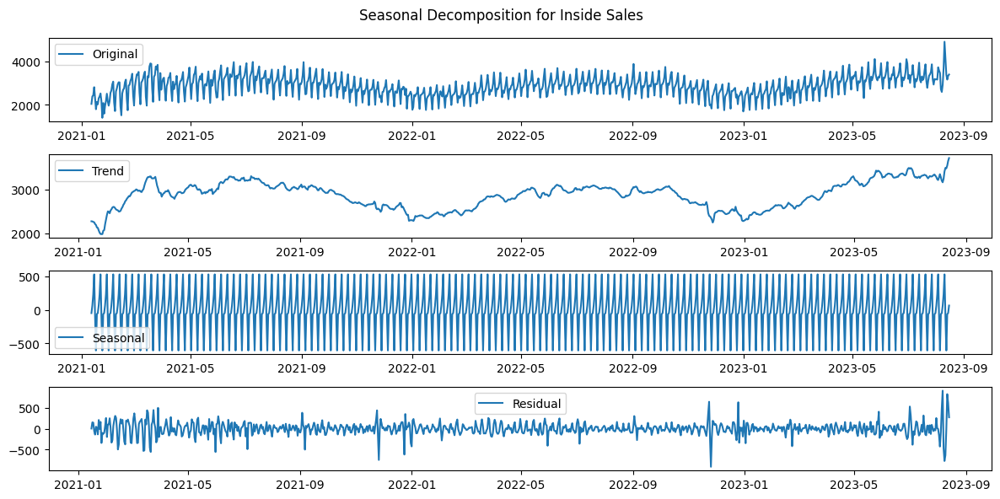

In [ ]:
# Aggregate sales data for all stores on each date
combined_sales = decom_df.groupby(decom_df.index)['daily_yoy_ndt.total_inside_sales'].mean()

# Perform seasonal decomposition for the combined sales data
result = sm.tsa.seasonal_decompose(combined_sales, model='additive')  # Change 'additive' to 'multiplicative' if necessary

# Access the decomposed components
trend = result.trend
seasonal = result.seasonal
residual = result.resid

# Plot the decomposed components for the combined sales data
plt.figure(figsize=(12, 6))
plt.suptitle('Seasonal Decomposition for Inside Sales')
plt.subplot(411)
plt.plot(combined_sales, label='Original')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(trend, label='Trend')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(seasonal, label='Seasonal')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(residual, label='Residual')
plt.legend(loc='best')
plt.tight_layout()

plt.show()



### Food Service Sales

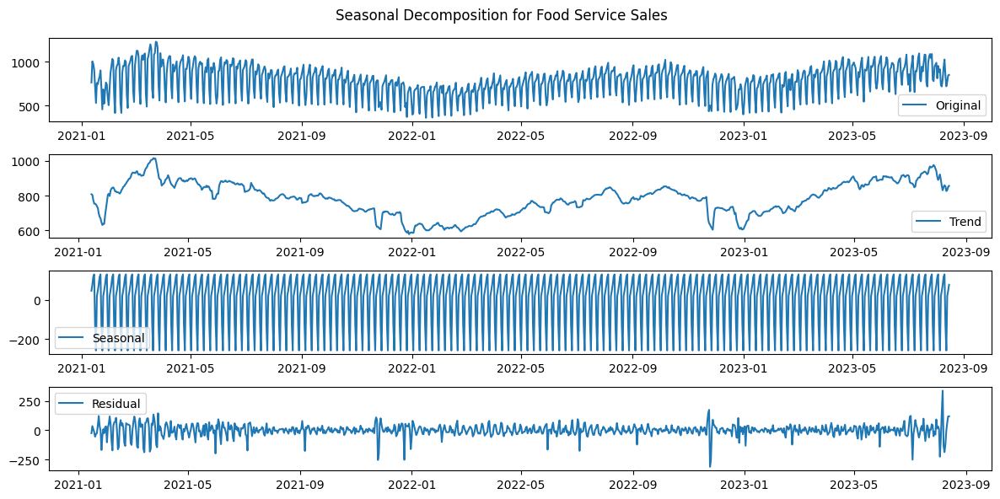

In [ ]:
# Aggregate sales data for all stores on each date
combined_sales = decom_df.groupby(decom_df.index)['daily_yoy_ndt.total_food_service'].mean()

# Perform seasonal decomposition for the combined sales data
result = sm.tsa.seasonal_decompose(combined_sales, model='additive')  # Change 'additive' to 'multiplicative' if necessary

# Access the decomposed components
trend = result.trend
seasonal = result.seasonal
residual = result.resid

# Plot the decomposed components for the combined sales data
plt.figure(figsize=(12, 6))
plt.suptitle('Seasonal Decomposition for Food Service Sales')
plt.subplot(411)
plt.plot(combined_sales, label='Original')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(trend, label='Trend')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(seasonal, label='Seasonal')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(residual, label='Residual')
plt.legend(loc='best')
plt.tight_layout()

### Diesel Sales

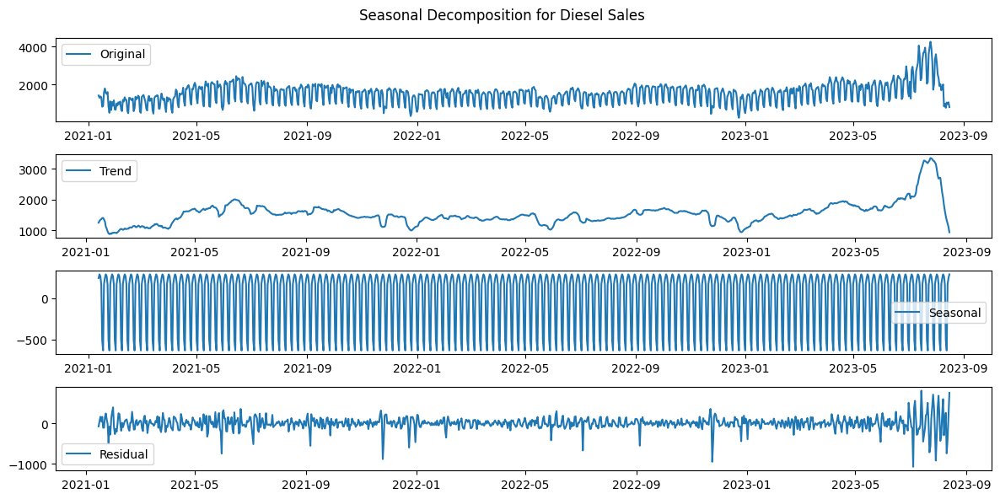

In [ ]:
# Aggregate sales data for all stores on each date
combined_sales = decom_df.groupby(decom_df.index)['diesel_y'].mean()

# Perform seasonal decomposition for the combined sales data
result = sm.tsa.seasonal_decompose(combined_sales, model='additive')  # Change 'additive' to 'multiplicative' if necessary

# Access the decomposed components
trend = result.trend
seasonal = result.seasonal
residual = result.resid

# Plot the decomposed components for the combined sales data
plt.figure(figsize=(12, 6))
plt.suptitle('Seasonal Decomposition for Diesel Sales')
plt.subplot(411)
plt.plot(combined_sales, label='Original')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(trend, label='Trend')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(seasonal, label='Seasonal')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(residual, label='Residual')
plt.legend(loc='best')
plt.tight_layout()

### Unleaded Sales

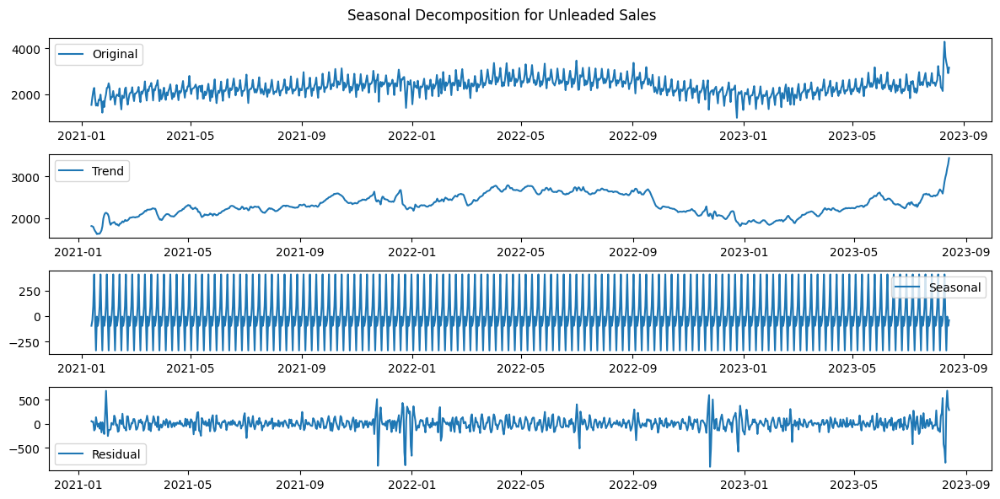

In [ ]:
# Aggregate sales data for all stores on each date
combined_sales = decom_df.groupby(decom_df.index)['unleaded'].mean()

# Perform seasonal decomposition for the combined sales data
result = sm.tsa.seasonal_decompose(combined_sales, model='additive')  # Change 'additive' to 'multiplicative' if necessary

# Access the decomposed components
trend = result.trend
seasonal = result.seasonal
residual = result.resid

# Plot the decomposed components for the combined sales data
plt.figure(figsize=(12, 6))
plt.suptitle('Seasonal Decomposition for Unleaded Sales')
plt.subplot(411)
plt.plot(combined_sales, label='Original')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(trend, label='Trend')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(seasonal, label='Seasonal')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(residual, label='Residual')
plt.legend(loc='best')
plt.tight_layout()

## Splitting the Data

In [ ]:
model_df = df.copy()

In [ ]:
model_df['site_id_msba'].nunique()
#There are 36 unique site IDs, I will use 6 site IDs for the test dataset and 30 for training

36

In [ ]:
np.random.seed(1234)

unique_sites = model_df['site_id_msba'].unique()
np.random.shuffle(unique_sites)
random_unique_sites = unique_sites[:6]
test_sites = random_unique_sites.tolist()

print(test_sites)

[22540, 24535, 22750, 22015, 22260, 23905]


In [ ]:
#Splitting the dataset into train and test sets based on site id

stores_for_testing = test_sites
stores_for_training = [x for x in unique_sites if x not in test_sites]

train_data = model_df[model_df['site_id_msba'].isin(stores_for_training)]
test_data = model_df[model_df['site_id_msba'].isin(stores_for_testing)]

In [ ]:
# Get unique 'site_id_msba' values from test_data
unique_site_ids = test_data['site_id_msba'].unique()

# Create a dictionary to store the separate DataFrames
test_data_dict = {}

# Iterate through unique site IDs and create separate DataFrames
for idx, site_id in enumerate(unique_site_ids, start=1):
    # Filter the test_data for the current site_id
    test_data_site = test_data[test_data['site_id_msba'] == site_id]

    # Store the filtered DataFrame in the dictionary with a numerical key
    test_data_dict[idx] = test_data_site

# Access the separate DataFrames as test_data_1, test_data_2, test_data_3, etc.
# For example, to access test_data for 'site_id_msba' 1:
test_data_1 = test_data_dict[1]
test_data_2 = test_data_dict[2]
test_data_3 = test_data_dict[3]
test_data_4 = test_data_dict[4]
test_data_5 = test_data_dict[5]
test_data_6 = test_data_dict[6]


In [ ]:
# Splitting by Train and Test for Prophet
np.random.seed(1234)
# First, determine which stores to include in the training and testing sets
unique_stores = df_prophet_copy['store_id'].unique()  # Ensure this contains all unique stores
# You could shuffle this array if you want a random selection of stores for train/test
np.random.shuffle(unique_stores)  # Only if random selection is desired

# Select stores for training and testing
train_stores = unique_stores[6:]
test_stores = unique_stores[:6]
print(test_stores.tolist())

[22540, 24535, 22750, 22015, 22260, 23905]


In [ ]:
# Define a function to split the data for each metric for Prophet
def split_data(prophet_df):
    train_data = prophet_df[prophet_df['store_id'].isin(train_stores)]
    test_data = prophet_df[prophet_df['store_id'].isin(test_stores)]
    return train_data, test_data

In [ ]:
# Split by Train and Test for each metric for Prophet
train_unleaded, test_unleaded = split_data(prophet_df_unleaded)
train_diesel, test_diesel = split_data(prophet_df_diesel)
train_food_sales, test_food_sales = split_data(prophet_df_food_sales)
train_inside_sales, test_inside_sales = split_data(prophet_df_inside_sales)

## Model Performance

### Benchmark: Average RMSE

We are going to use these scores as benchmark. We took the average of each sales metric and used it as prediction. Compared to our test data, the performance is as follows:

Inside Sales </br>
MAE: 707.2735125491541</br>
RMSE: 967.2567077320317</br>

Food Service</br>
MAE: 236.37052076466694</br>
RMSE: 298.75333424739136</br>

Diesel</br>
MAE: 889.6733050759848</br>
RMSE: 1003.2789422445452</br>

Unleaded</br>
MAE: 906.8842300356473</br>
RMSE: 1345.069038082699</br>

In [ ]:
# List of target columns (sales metrics)
target_columns = [
    'daily_yoy_ndt.total_inside_sales',
    'daily_yoy_ndt.total_food_service',
    'diesel_y',
    'unleaded'
]

# Initializing a dictionary to store evaluation results for each metric
evaluation_results = {}

# Looping through each target column
for metric in target_columns:
    # Calculating Historical Average for the current metric
    historical_average = train_data[metric].mean()

    # Making Predictions for test data for the current metric
    test_predictions = [historical_average] * len(test_data)

    # Calculating Evaluation Metrics for the current metric
    mae = mean_absolute_error(test_data[metric], test_predictions)
    rmse = np.sqrt(mean_squared_error(test_data[metric], test_predictions))

    evaluation_results[metric] = {'MAE': mae, 'RMSE': rmse}

# Printing the evaluation results for each metric
for metric, results in evaluation_results.items():
    print(f"Metric: {metric}")
    print(f"Mean Absolute Error (MAE): {results['MAE']}")
    print(f"Root Mean Squared Error (RMSE): {results['RMSE']}")


Metric: daily_yoy_ndt.total_inside_sales
Mean Absolute Error (MAE): 762.8913028417293
Root Mean Squared Error (RMSE): 1026.818063043741
Metric: daily_yoy_ndt.total_food_service
Mean Absolute Error (MAE): 250.78304172788074
Root Mean Squared Error (RMSE): 313.4568627363107
Metric: diesel_y
Mean Absolute Error (MAE): 852.1540893284612
Root Mean Squared Error (RMSE): 936.5451291030257
Metric: unleaded
Mean Absolute Error (MAE): 997.550369918854
Root Mean Squared Error (RMSE): 1442.5594549802984


### ETS

The ETS models are a family of time series models with an underlying state space model consisting of a level component, a trend component (T), a seasonal component (S), and an error term (E).

Our data shows a trend and seasonality based on the seasonal decomposition performed earlier. This is why we decided to choose ETS as one of the models to train and evaluate.

In [ ]:
train_ets = train_data.copy()

#### Inside Sales
Benchmark </br>
MAE: 707.27</br>
RMSE: 967.25</br>

Test 1

MAE:  503.89</br>
RMSE: 631.46

Test 2

MAE: 760.74 </br>
RMSE: 862.00

Test 3

MAE: 575.32 </br>
RMSE: 726.03 </br>

Test 4

MAE: 1554.37 </br>
RMSE: 1765.73 </br>

Test 5

MAE: 986.74 </br>
RMSE: 1119.62 </br>

Test 6

MAE: 551.14</br>
RMSE: 692.28 </br>

In [ ]:
columns_to_remove = ['daily_yoy_ndt.total_food_service', 'diesel_y', 'unleaded']
train_inside = train_ets.drop(columns=columns_to_remove)
target1 = 'daily_yoy_ndt.total_inside_sales'

In [ ]:
model_inside = ExponentialSmoothing(train_inside[target1], seasonal='add', seasonal_periods = 365)

model_fit_inside = model_inside.fit()

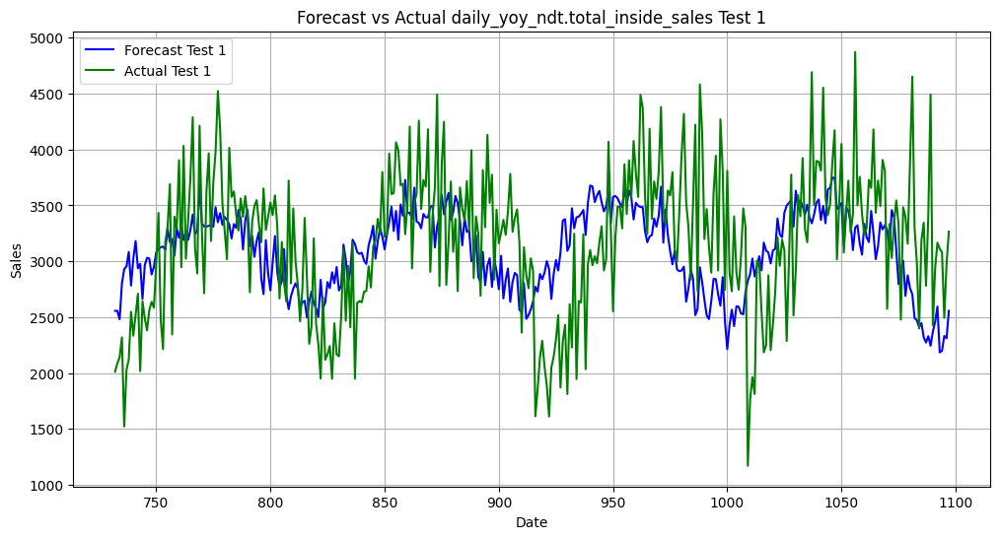

Mean Absolute Error (MAE) for Test 1: 503.8908219975461
Root Mean Squared Error (RMSE) for Test 1: 631.4653857366088


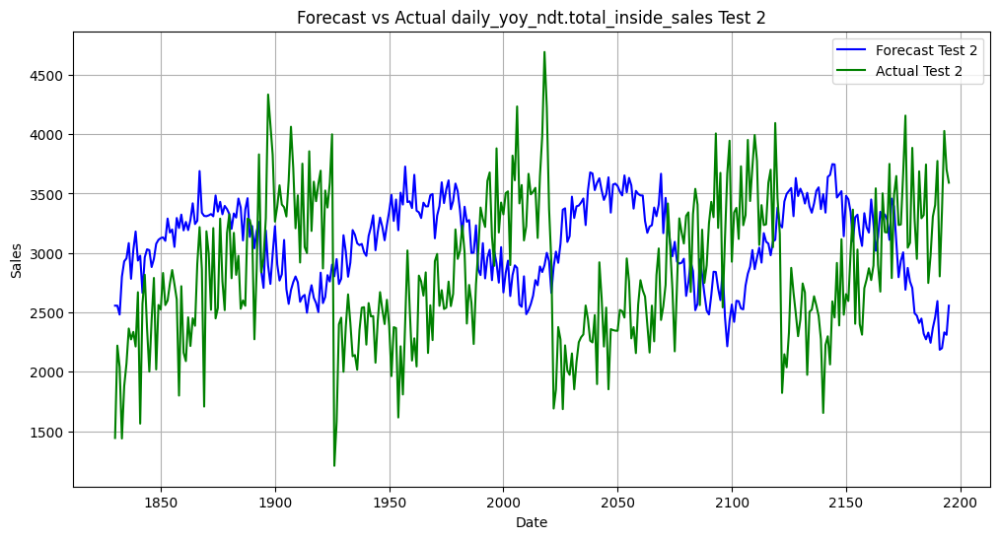

Mean Absolute Error (MAE) for Test 2: 760.7423194603731
Root Mean Squared Error (RMSE) for Test 2: 862.0015816336563


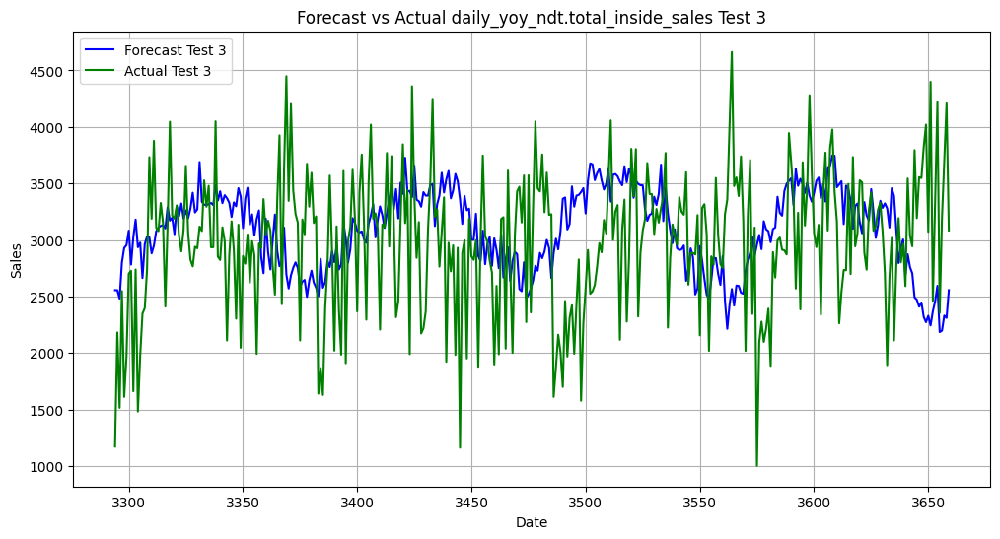

Mean Absolute Error (MAE) for Test 3: 575.3294234607363
Root Mean Squared Error (RMSE) for Test 3: 726.0356511615598


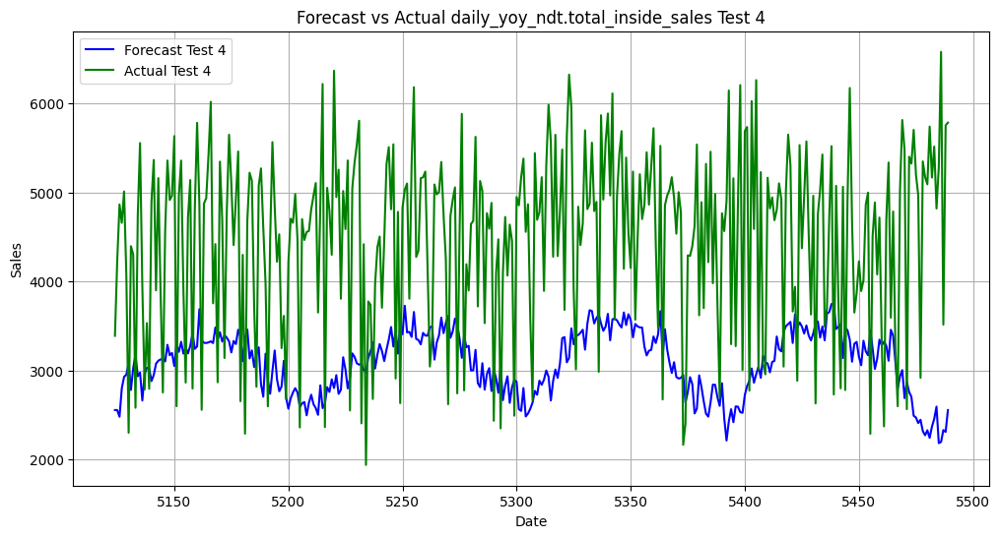

Mean Absolute Error (MAE) for Test 4: 1554.374186025674
Root Mean Squared Error (RMSE) for Test 4: 1765.7367360902733


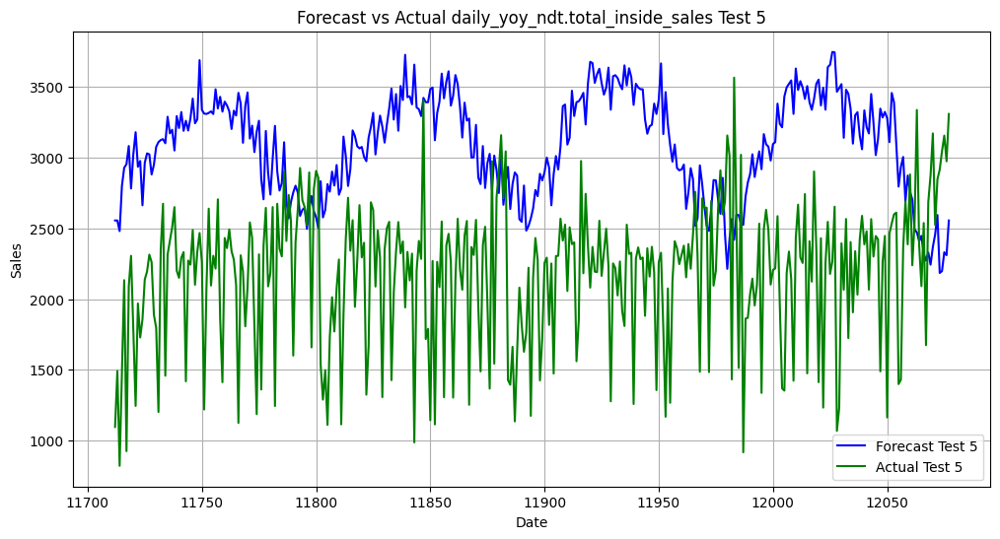

Mean Absolute Error (MAE) for Test 5: 986.7465455984793
Root Mean Squared Error (RMSE) for Test 5: 1119.625825243083


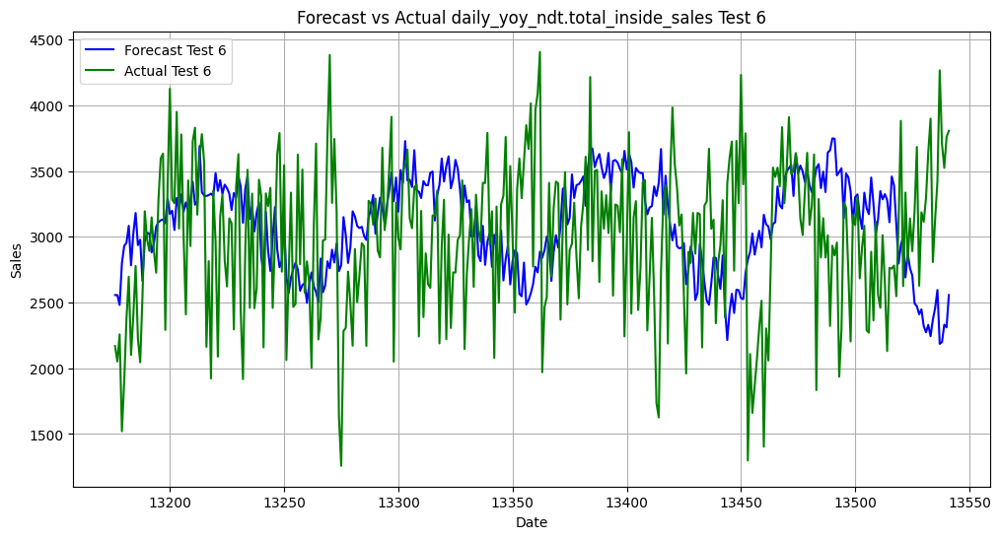

Mean Absolute Error (MAE) for Test 6: 551.1477565921797
Root Mean Squared Error (RMSE) for Test 6: 692.2802525670279


In [ ]:
# Defining a function to perform the forecast, plot, and calculate errors
def forecast_and_evaluate(model, test_data, target, test_number):
    forecast = model.forecast(steps=len(test_data))
    test_data = test_data.sort_index()

    # Plotting the forecast and actual data
    plt.figure(figsize=(12, 6))
    plt.plot(test_data.index, forecast, label=f"Forecast Test {test_number}", color='blue')
    plt.plot(test_data.index, test_data[target], label=f"Actual Test {test_number}", color='green')
    plt.title(f"Forecast vs Actual {target} Test {test_number}")
    plt.xlabel("Date")
    plt.ylabel("Sales")
    plt.legend()
    plt.grid(True)
    plt.show()

    # Calculating MAE and RMSE
    mae = mean_absolute_error(test_data[target], forecast)
    rmse = np.sqrt(mean_squared_error(test_data[target], forecast))

    print(f"Mean Absolute Error (MAE) for Test {test_number}: {mae}")
    print(f"Root Mean Squared Error (RMSE) for Test {test_number}: {rmse}")

test_data_list = [test_data_1, test_data_2, test_data_3, test_data_4, test_data_5, test_data_6]

model = model_fit_inside

# Looping through the test datasets and applying the function
for i, test_data in enumerate(test_data_list, start=1):
    target = target1
    forecast_and_evaluate(model, test_data, target, i)


#### Food Service

Benchmark</br>
MAE: 236.37</br>
RMSE: 298.75</br>

Test 1

MAE: 155.18</br>
RMSE: 196.79 </br>

Test 2

MAE: 366.29 </br>
RMSE: 384.48</br>

Test 3

MAE: 187.72 </br>
RMSE: 224.85 </br>

Test 4

MAE: 423.73</br>
RMSE: 462.54</br>

Test 5

MAE: 222.41 </br>
RMSE: 288.66</br>

Test 6

MAE: 211.78</br>
RMSE: 250.74

In [ ]:
columns_to_remove = ['daily_yoy_ndt.total_inside_sales', 'diesel_y', 'unleaded']
train_food = train_ets.drop(columns=columns_to_remove)
target2 = 'daily_yoy_ndt.total_food_service'

In [ ]:
model_food = ExponentialSmoothing(train_food[target2], seasonal='add', seasonal_periods = 120)

model_fit_food = model_food.fit()

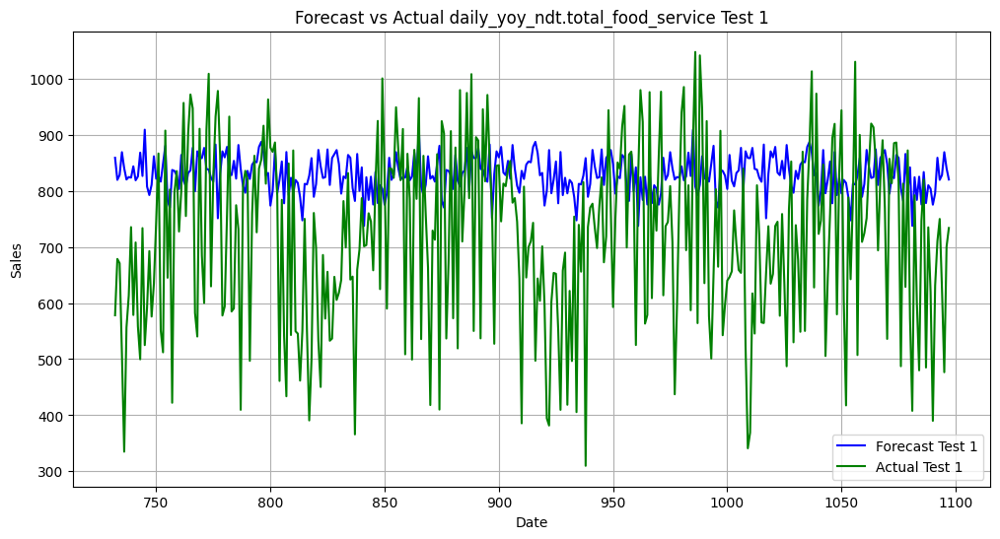

Mean Absolute Error (MAE) for Test 1: 155.184703050685
Root Mean Squared Error (RMSE) for Test 1: 196.79868253277127


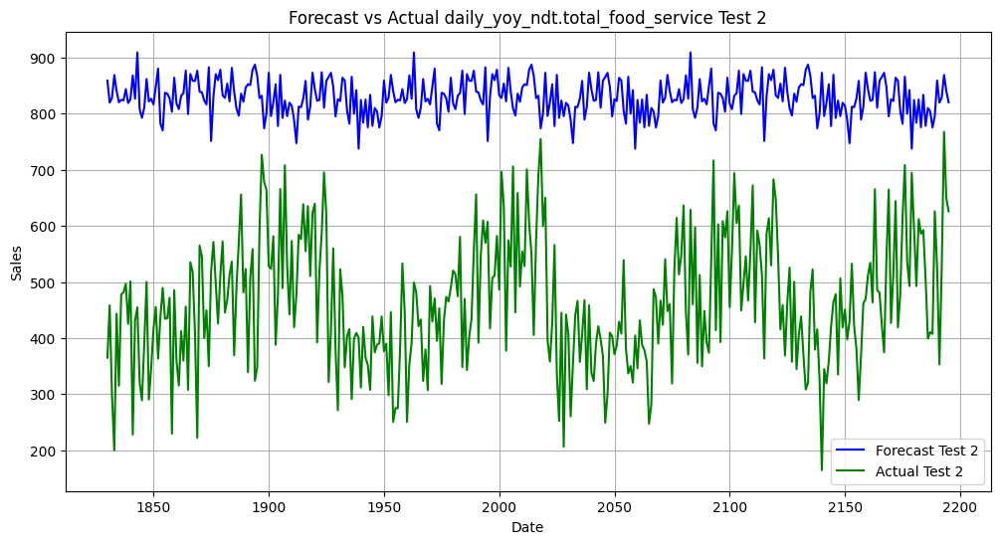

Mean Absolute Error (MAE) for Test 2: 366.29711844979295
Root Mean Squared Error (RMSE) for Test 2: 384.4887700395316


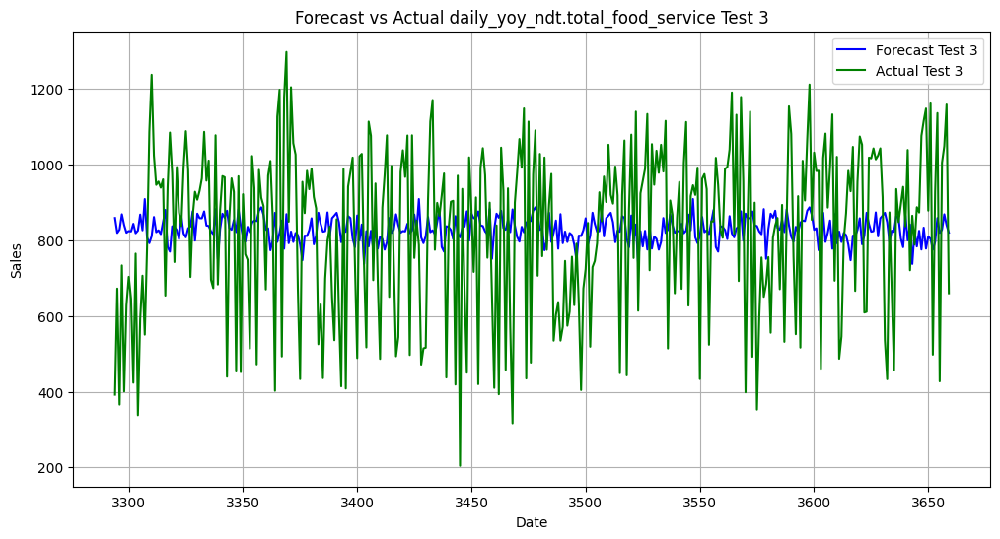

Mean Absolute Error (MAE) for Test 3: 187.72100616828462
Root Mean Squared Error (RMSE) for Test 3: 224.85664254786852


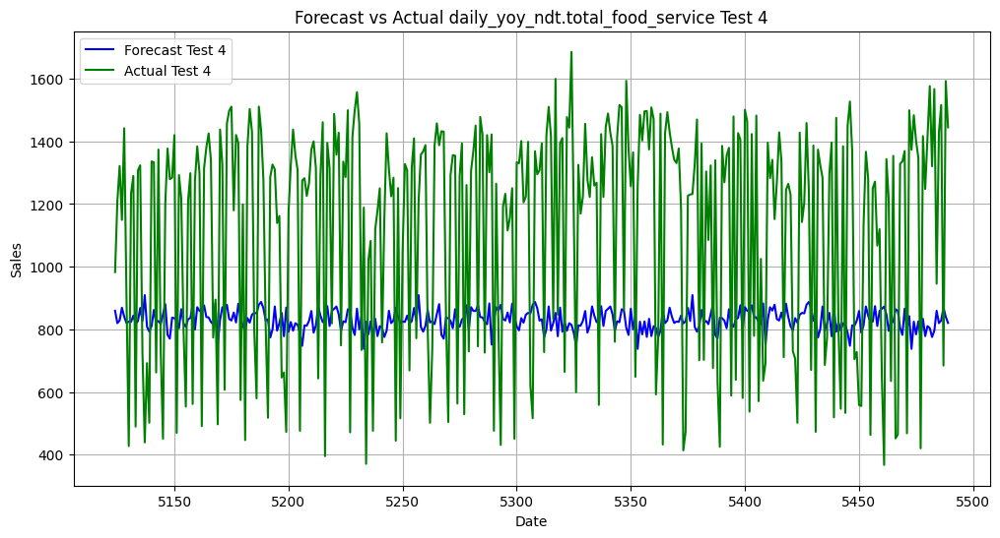

Mean Absolute Error (MAE) for Test 4: 423.73179532477127
Root Mean Squared Error (RMSE) for Test 4: 462.5468758725956


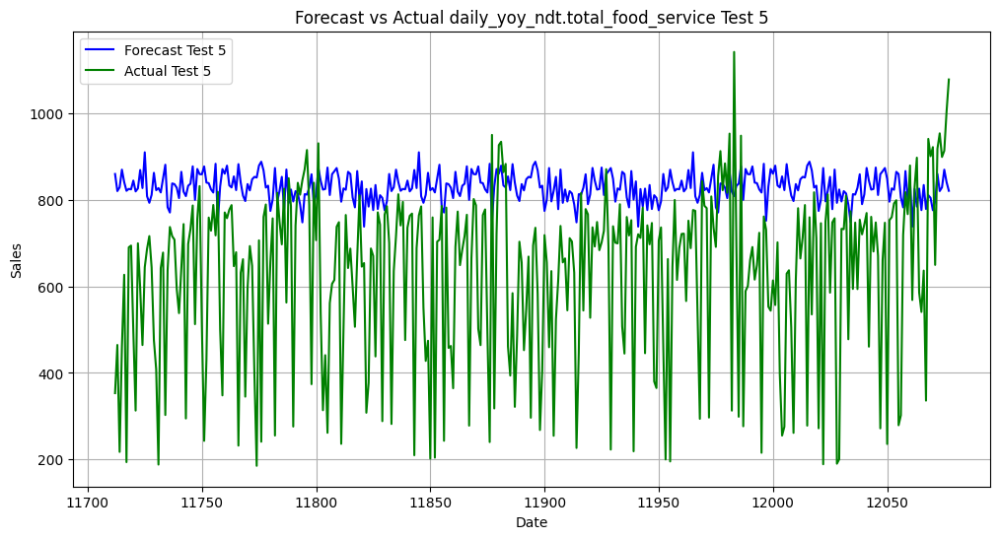

Mean Absolute Error (MAE) for Test 5: 222.4155607064844
Root Mean Squared Error (RMSE) for Test 5: 288.66993993884654


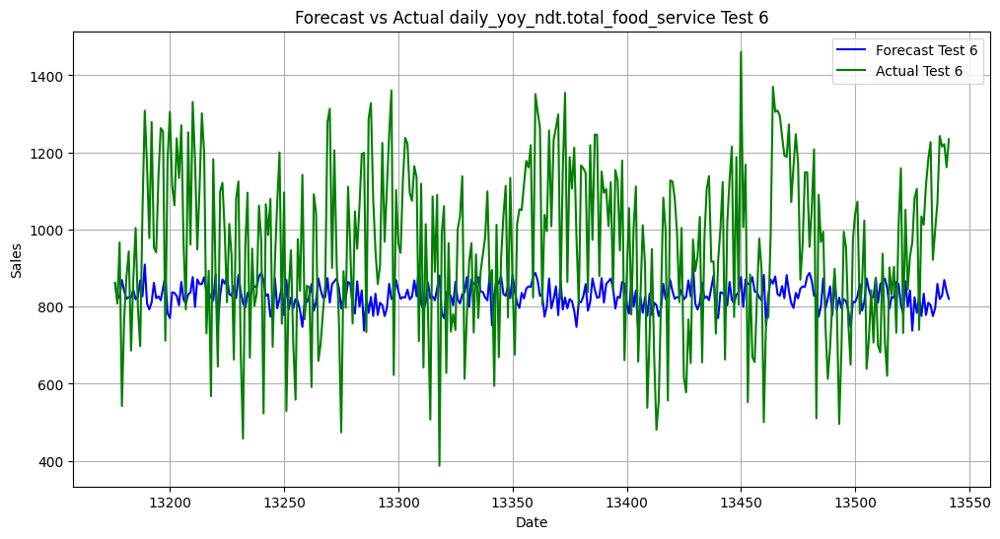

Mean Absolute Error (MAE) for Test 6: 211.78316174477425
Root Mean Squared Error (RMSE) for Test 6: 250.74191963498703


In [ ]:
# Defining a function to perform the forecast, plot, and calculate errors
def forecast_and_evaluate(model, test_data, target, test_number):
    forecast = model.forecast(steps=len(test_data))
    test_data = test_data.sort_index()

    # Plotting the forecast and actual data
    plt.figure(figsize=(12, 6))
    plt.plot(test_data.index, forecast, label=f"Forecast Test {test_number}", color='blue')
    plt.plot(test_data.index, test_data[target], label=f"Actual Test {test_number}", color='green')
    plt.title(f"Forecast vs Actual {target} Test {test_number}")
    plt.xlabel("Date")
    plt.ylabel("Sales")
    plt.legend()
    plt.grid(True)
    plt.show()

    # Calculaing MAE and RMSE
    mae = mean_absolute_error(test_data[target], forecast)
    rmse = np.sqrt(mean_squared_error(test_data[target], forecast))

    print(f"Mean Absolute Error (MAE) for Test {test_number}: {mae}")
    print(f"Root Mean Squared Error (RMSE) for Test {test_number}: {rmse}")

test_data_list = [test_data_1, test_data_2, test_data_3, test_data_4, test_data_5, test_data_6]

model = model_fit_food

# Looping through the test datasets and apply the function
for i, test_data in enumerate(test_data_list, start=1):
    target = target2  # Replace with your target column name
    forecast_and_evaluate(model, test_data, target, i)


#### Diesel

Benchmark</br>
MAE: 889.67</br>
RMSE: 1003.27</br>

Test 1

MAE: 297.63 </br>
RMSE: 368.73 </br>

Test 2

MAE: 372.98</br>
RMSE: 437.90</br>

Test 3

MAE: 1202.85</br>
RMSE: 1385.61</br>

Test 4

MAE: 992.33</br>
RMSE: 1160.30</br>

Test 5

MAE: 544.97</br>
RMSE: 607.49</br>

Test 6

MAE: 661.04</br>
RMSE: 805.87</br>

In [ ]:
columns_to_remove = ['daily_yoy_ndt.total_inside_sales','daily_yoy_ndt.total_food_service', 'unleaded']
train_diesel = train_ets.drop(columns=columns_to_remove)
train_diesel = train_diesel.groupby('calendar.calendar_day_date').mean()
target3 = 'diesel_y'

In [ ]:
model_diesel= ExponentialSmoothing(train_diesel[target3], seasonal='add', seasonal_periods = 120)

model_fit_diesel = model_diesel.fit()

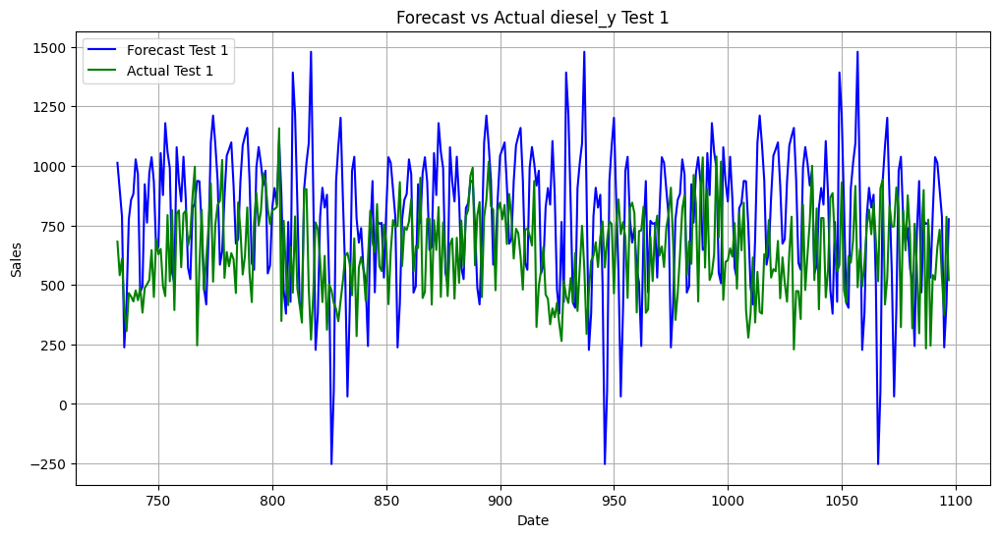

Mean Absolute Error (MAE) for Test 1: 297.632964108849
Root Mean Squared Error (RMSE) for Test 1: 368.7300251599922


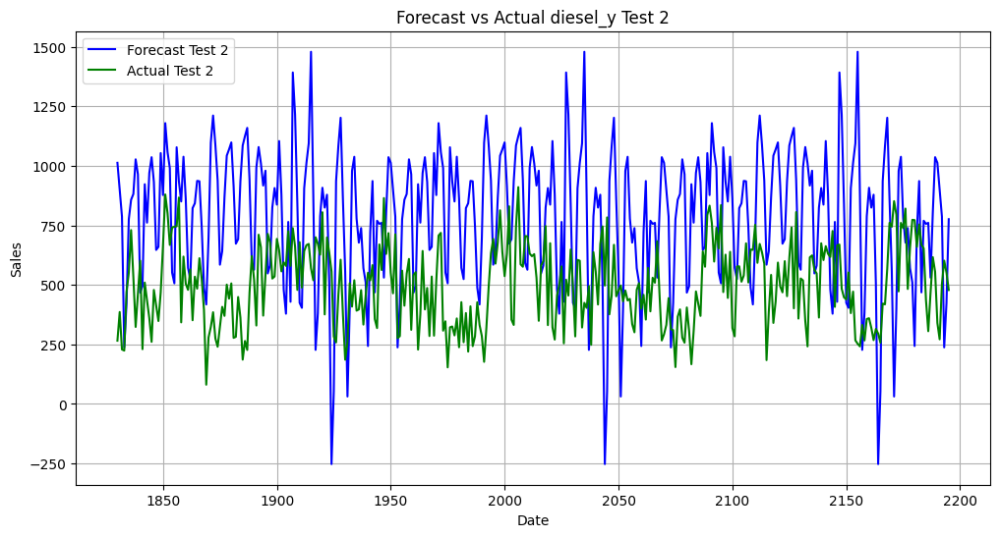

Mean Absolute Error (MAE) for Test 2: 372.9866366845219
Root Mean Squared Error (RMSE) for Test 2: 437.9025528639676


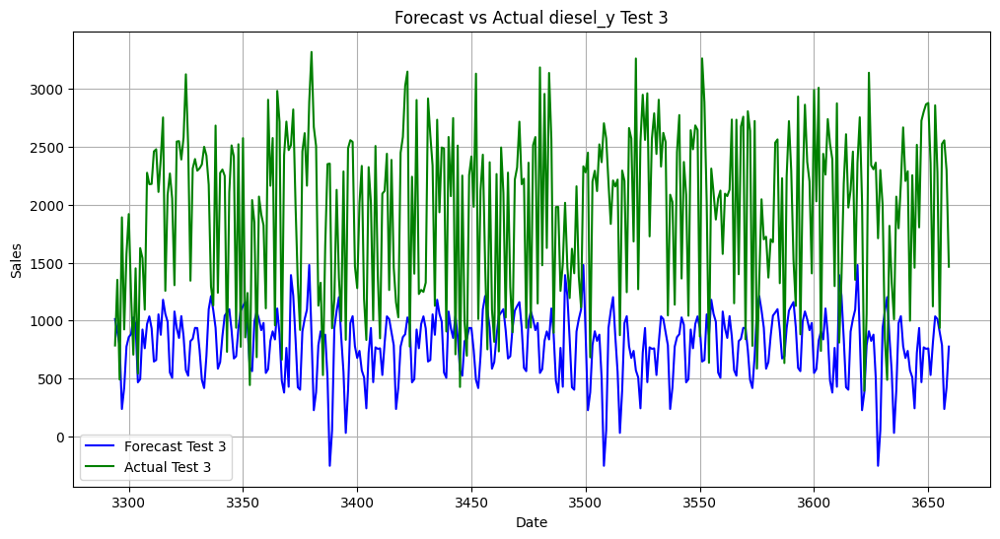

Mean Absolute Error (MAE) for Test 3: 1202.8598132541758
Root Mean Squared Error (RMSE) for Test 3: 1385.6156600062932


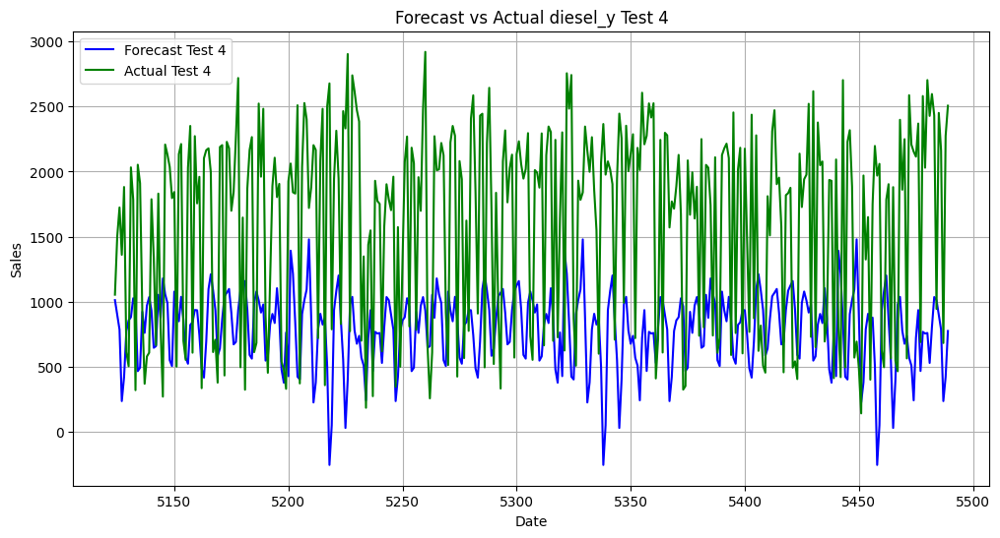

Mean Absolute Error (MAE) for Test 4: 992.339332314231
Root Mean Squared Error (RMSE) for Test 4: 1160.3047419446466


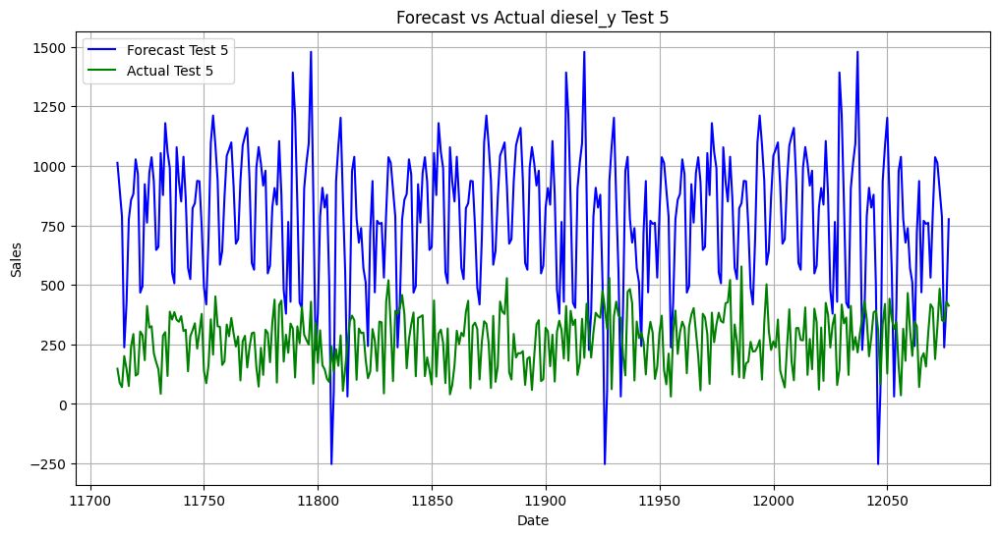

Mean Absolute Error (MAE) for Test 5: 544.9773257105106
Root Mean Squared Error (RMSE) for Test 5: 607.4971452835559


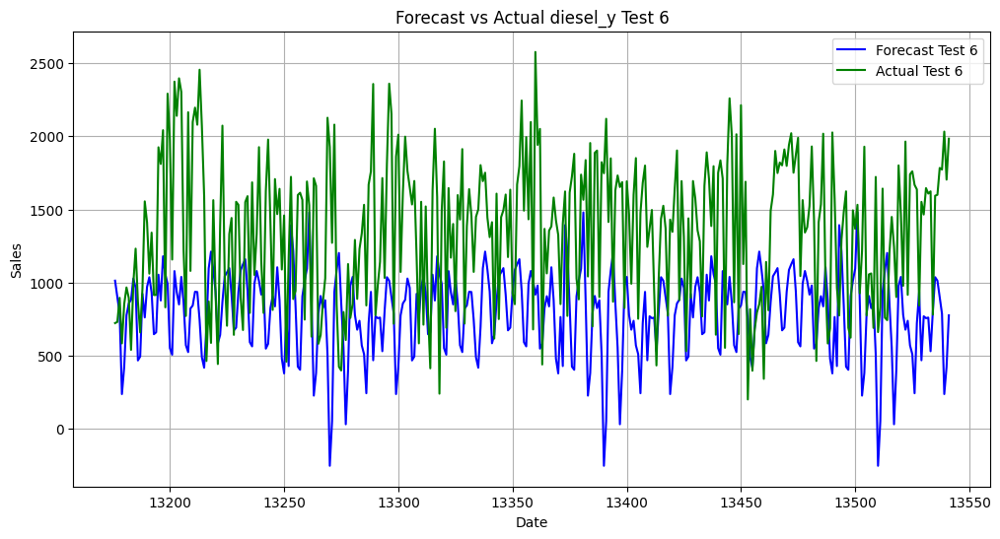

Mean Absolute Error (MAE) for Test 6: 661.0451902619449
Root Mean Squared Error (RMSE) for Test 6: 805.8783424195829


In [ ]:
# Defining a function to perform the forecast, plot, and calculate errors
def forecast_and_evaluate(model, test_data, target, test_number):
    forecast = model.forecast(steps=len(test_data))
    test_data = test_data.sort_index()

    # Plotting the forecast and actual data
    plt.figure(figsize=(12, 6))
    plt.plot(test_data.index, forecast, label=f"Forecast Test {test_number}", color='blue')
    plt.plot(test_data.index, test_data[target], label=f"Actual Test {test_number}", color='green')
    plt.title(f"Forecast vs Actual {target} Test {test_number}")
    plt.xlabel("Date")
    plt.ylabel("Sales")
    plt.legend()
    plt.grid(True)
    plt.show()

    # Calculating MAE and RMSE
    mae = mean_absolute_error(test_data[target], forecast)
    rmse = np.sqrt(mean_squared_error(test_data[target], forecast))

    print(f"Mean Absolute Error (MAE) for Test {test_number}: {mae}")
    print(f"Root Mean Squared Error (RMSE) for Test {test_number}: {rmse}")

test_data_list = [test_data_1, test_data_2, test_data_3, test_data_4, test_data_5, test_data_6]

model = model_fit_diesel

# Loop through the test datasets and apply the function
for i, test_data in enumerate(test_data_list, start=1):
    target = target3  # Replace with your target column name
    forecast_and_evaluate(model, test_data, target, i)


#### Unleaded

Benchmark</br>
MAE: 906.88</br>
RMSE: 1345.06</br>

Test 1

MAE: 779.46 </br>
RMSE: 862.54</br>

Test 2

MAE: 3223.10</br>
RMSE: 3459.38</br>

Test 3

MAE: 819.70</br>
RMSE: 994.29</br>

Test 4

MAE: 537.34</br>
RMSE: 635.64</br>

Test 5

MAE: 596.21</br>
RMSE: 694.44</br>

Test 6

MAE: 1021.02 </br>
RMSE: 1170.13

In [ ]:
columns_to_remove = ['daily_yoy_ndt.total_inside_sales','daily_yoy_ndt.total_food_service','diesel_y' ]
train_unleaded = train_ets.drop(columns=columns_to_remove)
train_unlaeded = train_unleaded.groupby('calendar.calendar_day_date').mean()
target4 = 'unleaded'

In [ ]:
model_unleaded = ExponentialSmoothing(train_unleaded[target4], seasonal='add', seasonal_periods = 365)

model_fit_unleaded = model_unleaded.fit()

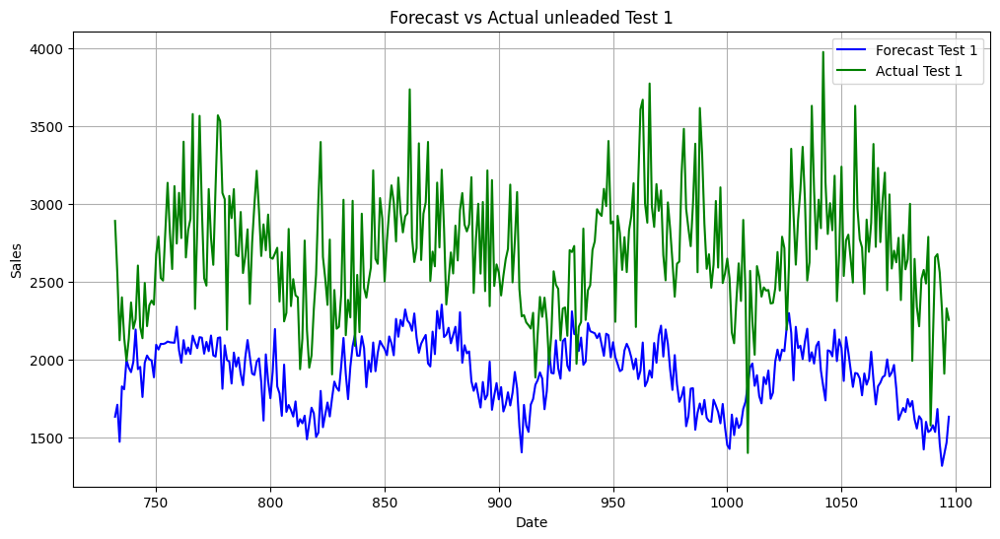

Mean Absolute Error (MAE) for Test 1: 779.463298670218
Root Mean Squared Error (RMSE) for Test 1: 862.5460563326361


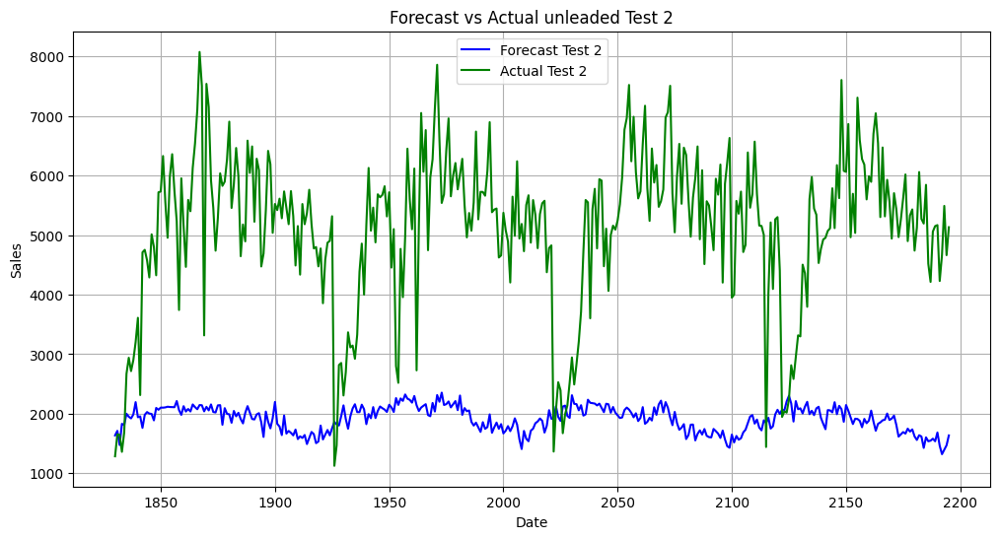

Mean Absolute Error (MAE) for Test 2: 3223.1010652083187
Root Mean Squared Error (RMSE) for Test 2: 3459.3823379178166


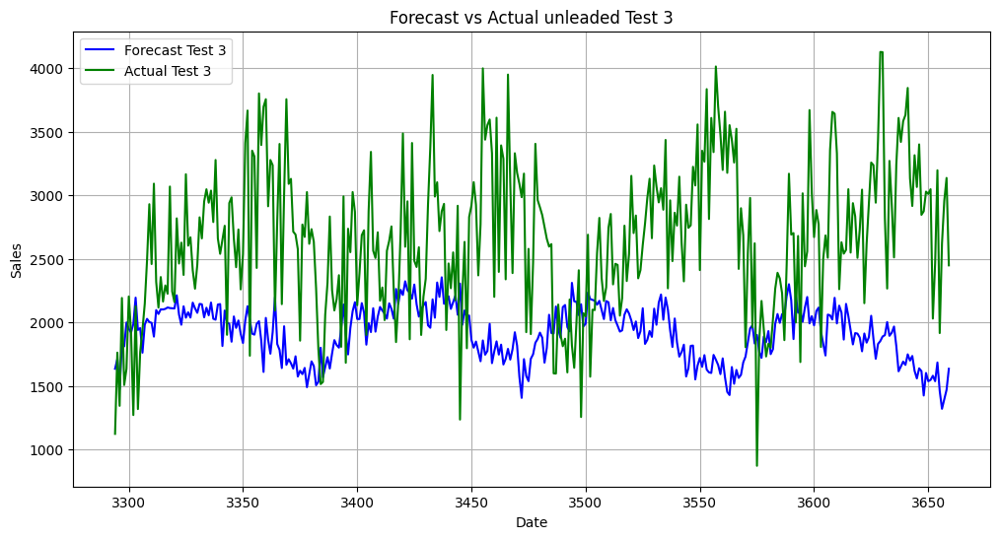

Mean Absolute Error (MAE) for Test 3: 819.7050168707748
Root Mean Squared Error (RMSE) for Test 3: 994.2903537618611


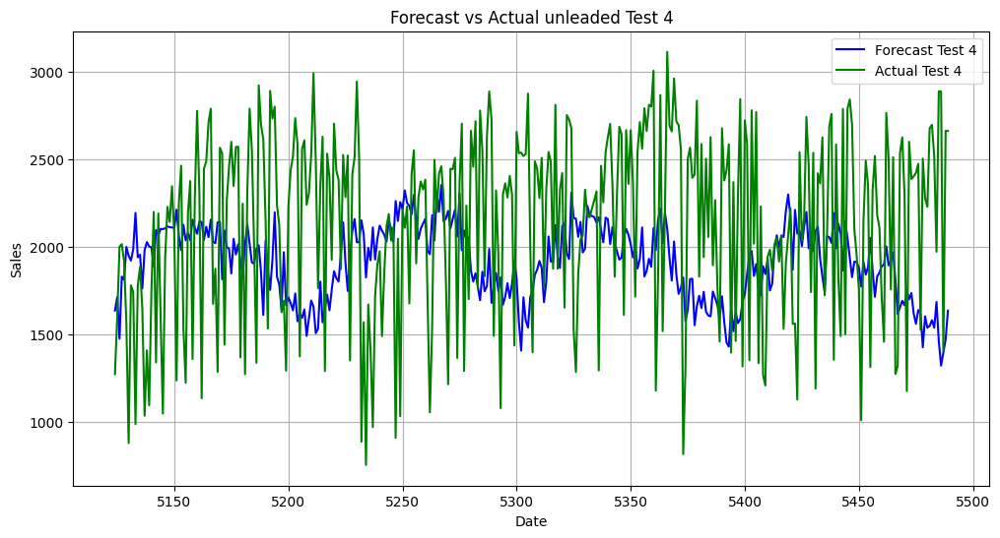

Mean Absolute Error (MAE) for Test 4: 537.3494224925529
Root Mean Squared Error (RMSE) for Test 4: 635.6412184956494


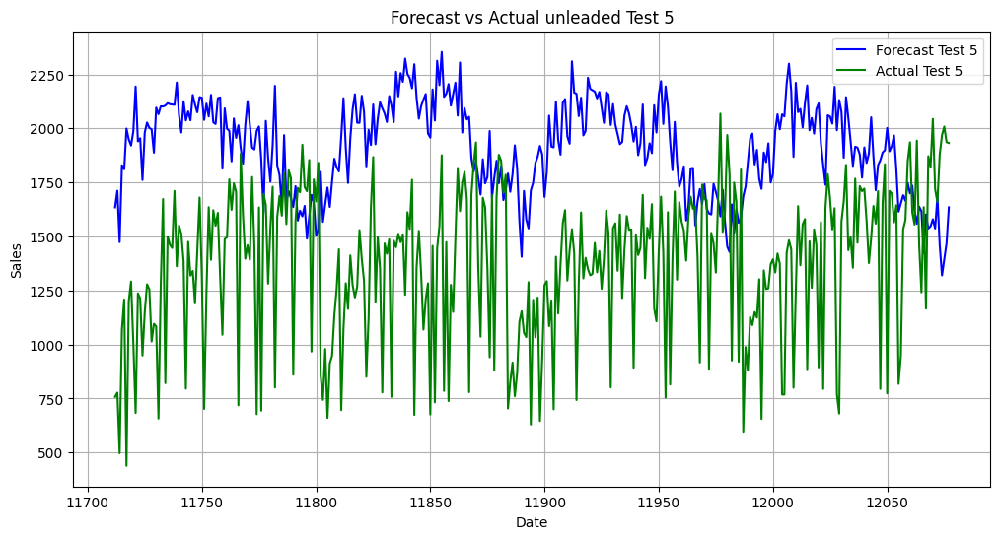

Mean Absolute Error (MAE) for Test 5: 596.2120432888739
Root Mean Squared Error (RMSE) for Test 5: 694.442747780334


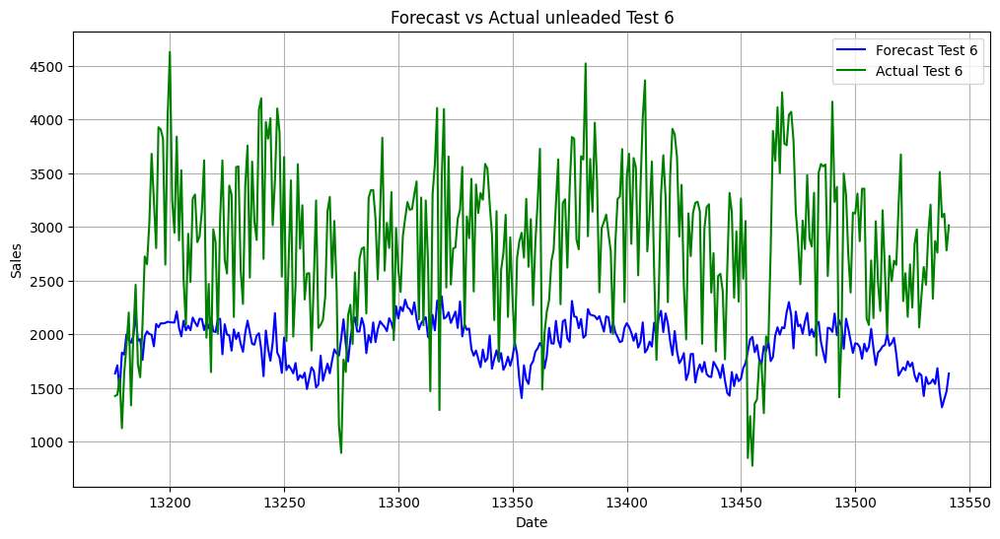

Mean Absolute Error (MAE) for Test 6: 1021.0236796923208
Root Mean Squared Error (RMSE) for Test 6: 1170.1364082785353


In [ ]:
# Defining a function to perform the forecast, plot, and calculate errors
def forecast_and_evaluate(model, test_data, target, test_number):
    forecast = model.forecast(steps=len(test_data))
    test_data = test_data.sort_index()

    # Plotting the forecast and actual data
    plt.figure(figsize=(12, 6))
    plt.plot(test_data.index, forecast, label=f"Forecast Test {test_number}", color='blue')
    plt.plot(test_data.index, test_data[target], label=f"Actual Test {test_number}", color='green')
    plt.title(f"Forecast vs Actual {target} Test {test_number}")
    plt.xlabel("Date")
    plt.ylabel("Sales")
    plt.legend()
    plt.grid(True)
    plt.show()

    # Calculating MAE and RMSE
    mae = mean_absolute_error(test_data[target], forecast)
    rmse = np.sqrt(mean_squared_error(test_data[target], forecast))

    print(f"Mean Absolute Error (MAE) for Test {test_number}: {mae}")
    print(f"Root Mean Squared Error (RMSE) for Test {test_number}: {rmse}")

test_data_list = [test_data_1, test_data_2, test_data_3, test_data_4, test_data_5, test_data_6]

model = model_fit_unleaded

# Looping through the test datasets and apply the function
for i, test_data in enumerate(test_data_list, start=1):
    target = target4
    forecast_and_evaluate(model, test_data, target, i)


### ARIMA

ARIMA is a model used for forecasting future outcomes based on a historical time series. It is based on the statistical concept of serial correlation, where past data points influence future data points. ARIMA is flexible and can handle a wide range of time series data patterns, including trends, seasonality, and autocorrelation which is why we chose ARIMA as one of the models for this project.

In [ ]:
import math
from statsmodels.tsa.statespace.sarimax import SARIMAX
import statsmodels.api as sm

# train_data.set_index('calendar.calendar_day_date', inplace = True)
train_data = train_data.sort_values(by='calendar.calendar_day_date')

# test_data.set_index('calendar.calendar_day_date', inplace = True)
test_data = test_data.sort_values(by='calendar.calendar_day_date')

In [ ]:
# Function to train arima model which will be fit for each stores in the training data set

def train_arima_models(data,metric):
    store_ids = data['site_id_msba'].unique()
    models = {}

    for store_id in store_ids:
        store_data = data[data['site_id_msba'] == store_id]
        time_series = store_data[metric]

        # Train ARIMA model
        model = sm.tsa.SARIMAX(time_series, order = (2, 1, 3))
        model_fit = model.fit()

        models[store_id] = model_fit

    return models

In [ ]:
# Function to average the forecast for stores in test data set predicted by all the models fitted for each stores in train dataset
def average_forecast_for_test_stores(models, test_data,metric):
    new_store_ids = set(test_data['site_id_msba'].unique()) - set(models.keys())
    all_forecasts = []

    for store_id in new_store_ids:
        store_data = test_data[test_data['site_id_msba'] == store_id]
        time_series = store_data[metric]

        # Use the average forecast from all models for new stores
        average_forecast = np.mean([model.forecast(steps=len(time_series)) for model in models.values()], axis=0)
        all_forecasts.append(average_forecast)

    if all_forecasts:
        return all_forecasts
    else:
        return None

#### Inside Sales


In [ ]:
# Train ARIMA models for each store in traindf
models = train_arima_models(train_data,'daily_yoy_ndt.total_inside_sales')

In [ ]:
# Make an average forecast for store IDs in the test dataset that are not in the training dataset
test_store_forecasts = average_forecast_for_test_stores(models, test_data,'daily_yoy_ndt.total_inside_sales')

# if test_store_forecasts is not None:
#     for store_id, forecast in zip(set(test_data['site_id_msba'].unique()) - set(models.keys()), test_store_forecasts):
#         print(f'Average Forecast for Store {store_id}:\n{forecast}')
# else:
#     print('No matching models found in the training data for the new test data store IDs.')

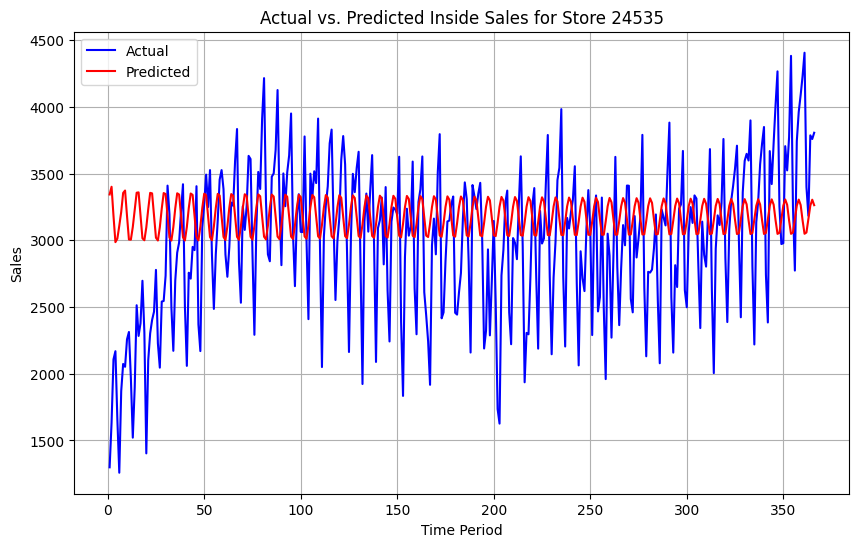

In [ ]:
# Plot the actual vs predicted values of Inside Sales for each stores in test set
if test_store_forecasts is not None:
    for store_id, forecast in zip(set(test_data['site_id_msba'].unique()) - set(models.keys()), test_store_forecasts):
        store_data = test_data[test_data['site_id_msba'] == store_id]
        actual_data = store_data['daily_yoy_ndt.total_inside_sales']
        time_index = range(1, len(actual_data) + 1)
        plt.figure(figsize=(10, 6))
        plt.plot(time_index, actual_data, label='Actual', linestyle='-', color='blue')
        plt.plot(time_index, forecast, label='Predicted', linestyle='-', color='red')
        plt.title(f'Actual vs. Predicted Inside Sales for Store {store_id}')
        plt.xlabel('Time Period')
        plt.ylabel('Sales')
        plt.legend()
        plt.grid(True)
        plt.show()

In [ ]:
# Evaluate the prediction error metrics for Inside Sales
results = {}
if test_store_forecasts is not None:
    for store_id, forecast in zip(set(test_data['site_id_msba'].unique()) - set(models.keys()), test_store_forecasts):
        store_data = test_data[test_data['site_id_msba'] == store_id]
        actual_data = store_data['daily_yoy_ndt.total_inside_sales']
        # Calculate the Mean Squared Error (MSE) for the predictions
        mse = mean_squared_error(actual_data, forecast)

        # Calculate the Root Mean Squared Error (RMSE)
        rmse = math.sqrt(mse)

        # Store the results in the dictionary
        results['daily_yoy_ndt.total_inside_sales'] = {
            'Predictions': forecast,
            'MSE': mse,
            'RMSE': rmse
        }

        print(f"RMSE of Inside sales for Store {store_id}: {rmse}")
        print('\n')

RMSE of Inside sales for Store 23905: 1120.8750029870253


RMSE of Inside sales for Store 22540: 672.9215383938218


RMSE of Inside sales for Store 22260: 710.9140873161022


RMSE of Inside sales for Store 24535: 606.1237212023235


RMSE of Inside sales for Store 22750: 1639.5793287983915


RMSE of Inside sales for Store 22015: 672.2484651001769




#### Food Service


In [ ]:
# Train ARIMA models for each store in traindf
models = train_arima_models(train_data,'daily_yoy_ndt.total_food_service')

In [ ]:
# Make an average forecast for store IDs in the test dataset that are not in the training dataset
test_store_forecasts = average_forecast_for_test_stores(models, test_data,'daily_yoy_ndt.total_food_service')

# if test_store_forecasts is not None:
#     for store_id, forecast in zip(set(test_data['site_id_msba'].unique()) - set(models.keys()), test_store_forecasts):
#         print(f'Average Forecast for Store {store_id}:\n{forecast}')
# else:
#     print('No matching models found in the training data for the new test data store IDs.')

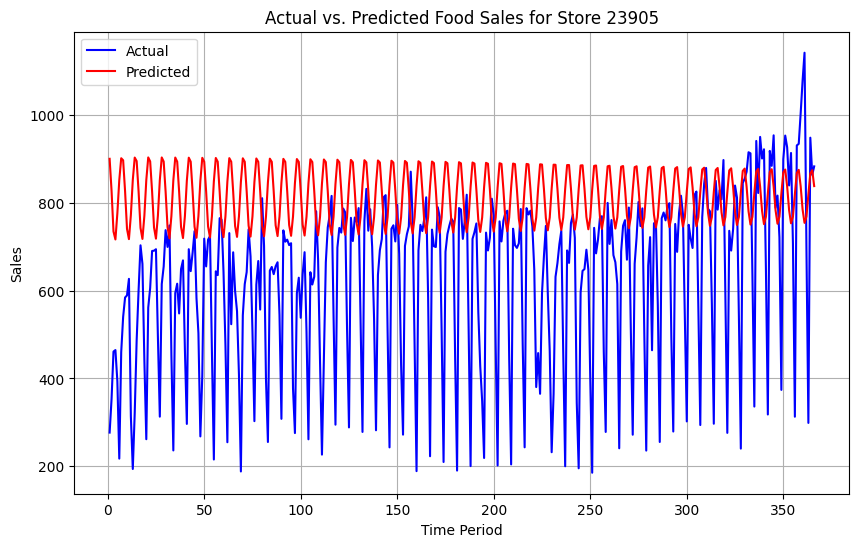

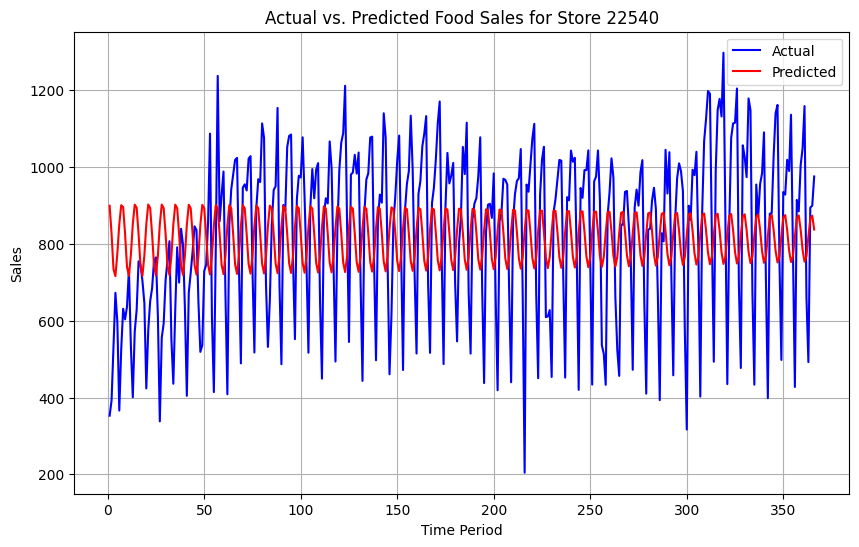

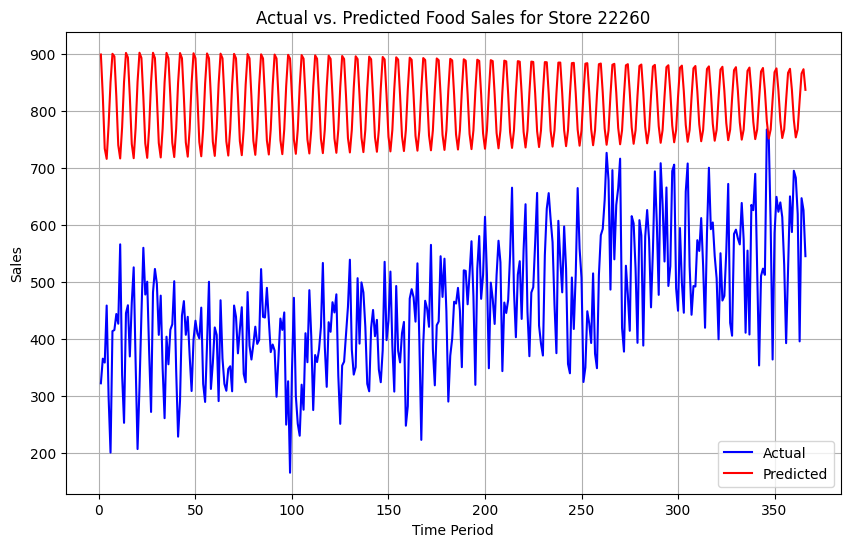

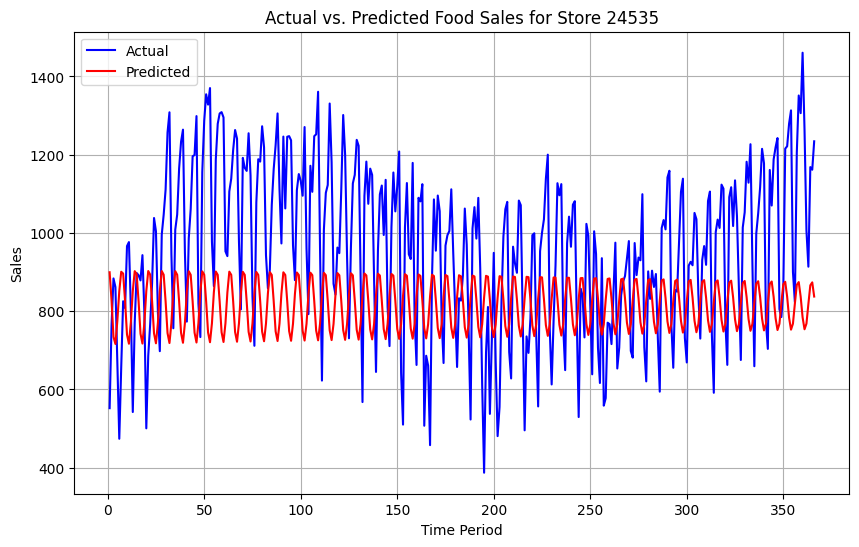

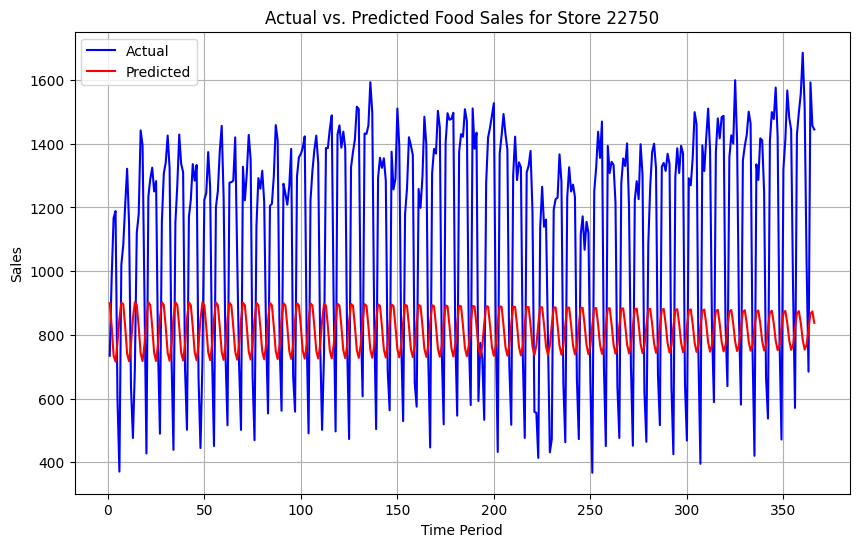

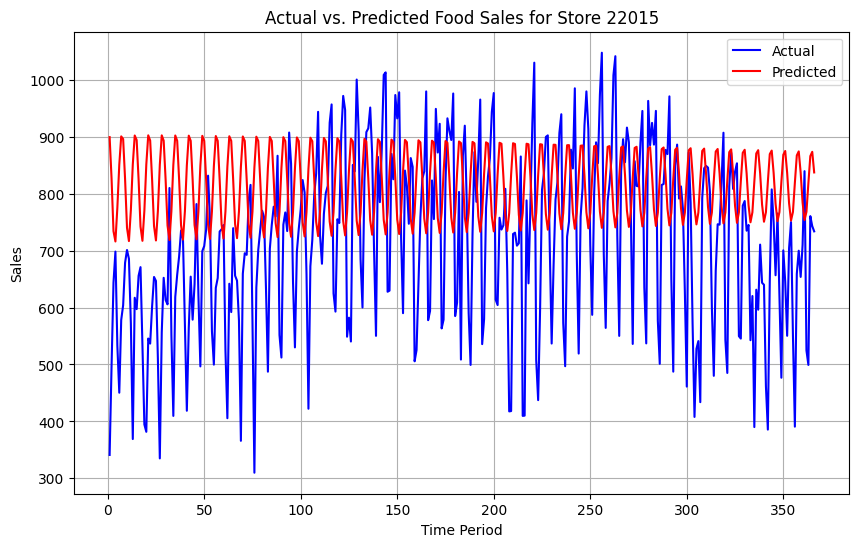

In [ ]:
# Plot the actual vs predicted values of Food Service Sales for each stores in test set
if test_store_forecasts is not None:
    for store_id, forecast in zip(set(test_data['site_id_msba'].unique()) - set(models.keys()), test_store_forecasts):
        store_data = test_data[test_data['site_id_msba'] == store_id]
        actual_data = store_data['daily_yoy_ndt.total_food_service']
        time_index = range(1, len(actual_data) + 1)
        plt.figure(figsize=(10, 6))
        plt.plot(time_index, actual_data, label='Actual', linestyle='-', color='blue')
        plt.plot(time_index, forecast, label='Predicted', linestyle='-', color='red')
        plt.title(f'Actual vs. Predicted Food Sales for Store {store_id}')
        plt.xlabel('Time Period')
        plt.ylabel('Sales')
        plt.legend()
        plt.grid(True)
        plt.show()

In [ ]:
# Evaluate the prediction error metrics for Food service Sales
results = {}
if test_store_forecasts is not None:
    for store_id, forecast in zip(set(test_data['site_id_msba'].unique()) - set(models.keys()), test_store_forecasts):
        store_data = test_data[test_data['site_id_msba'] == store_id]
        actual_data = store_data['daily_yoy_ndt.total_food_service']
        # Calculate the Mean Squared Error (MSE) for the predictions
        mse = mean_squared_error(actual_data, forecast)

        # Calculate the Root Mean Squared Error (RMSE)
        rmse = math.sqrt(mse)

        # Store the results in the dictionary
        results['daily_yoy_ndt.total_food_service'] = {
            'Predictions': forecast,
            'MSE': mse,
            'RMSE': rmse
        }

        print(f"RMSE of Food Service sales for Store {store_id}: {rmse}")
        print('\n')

RMSE of Food Service sales for Store 23905: 284.6174051942619


RMSE of Food Service sales for Store 22540: 237.197871223956


RMSE of Food Service sales for Store 22260: 377.39343057483745


RMSE of Food Service sales for Store 24535: 270.8410790117788


RMSE of Food Service sales for Store 22750: 473.89577942597174


RMSE of Food Service sales for Store 22015: 204.08412969189905




#### Diesel


In [ ]:
# Train ARIMA models for each store in traindf
models = train_arima_models(train_data,'diesel_y')

In [ ]:
# Make an average forecast for store IDs in the test dataset that are not in the training dataset
test_store_forecasts = average_forecast_for_test_stores(models, test_data,'diesel_y')

# if test_store_forecasts is not None:
#     for store_id, forecast in zip(set(test_data['site_id_msba'].unique()) - set(models.keys()), test_store_forecasts):
#         print(f'Average Forecast for Store {store_id}:\n{forecast}')
# else:
#     print('No matching models found in the training data for the new test data store IDs.')

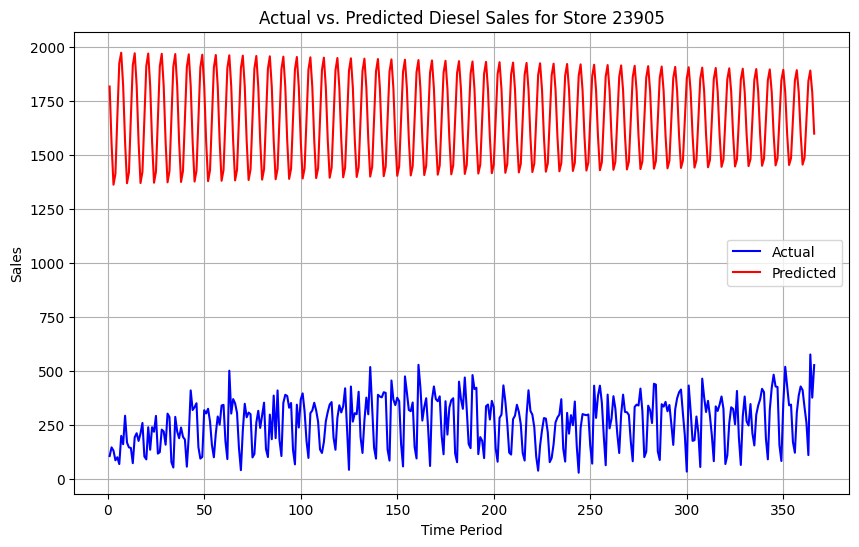

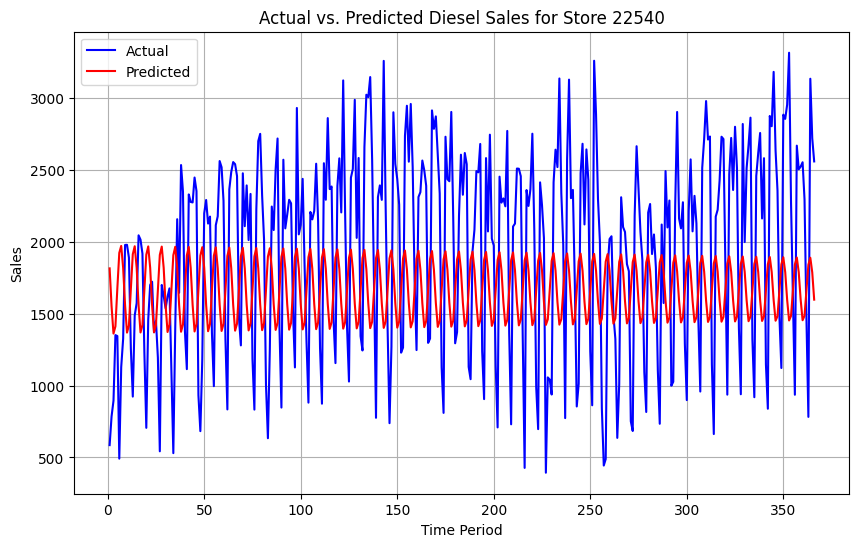

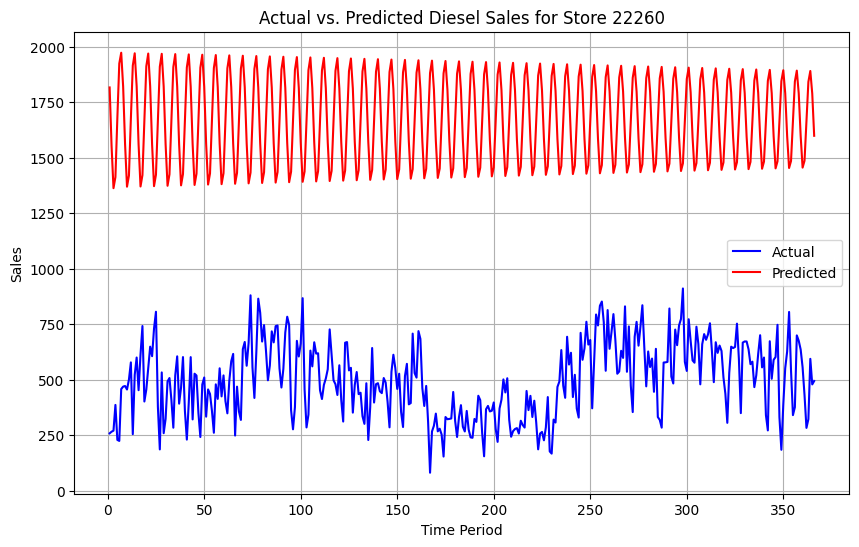

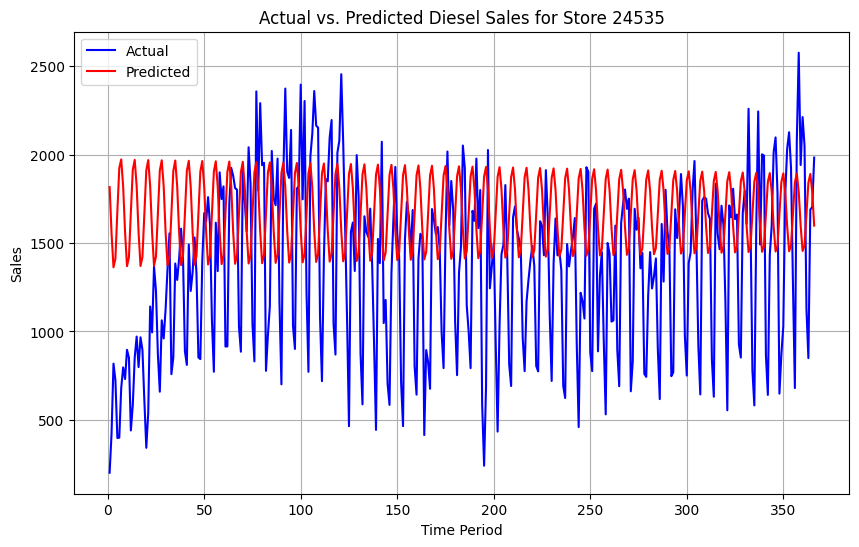

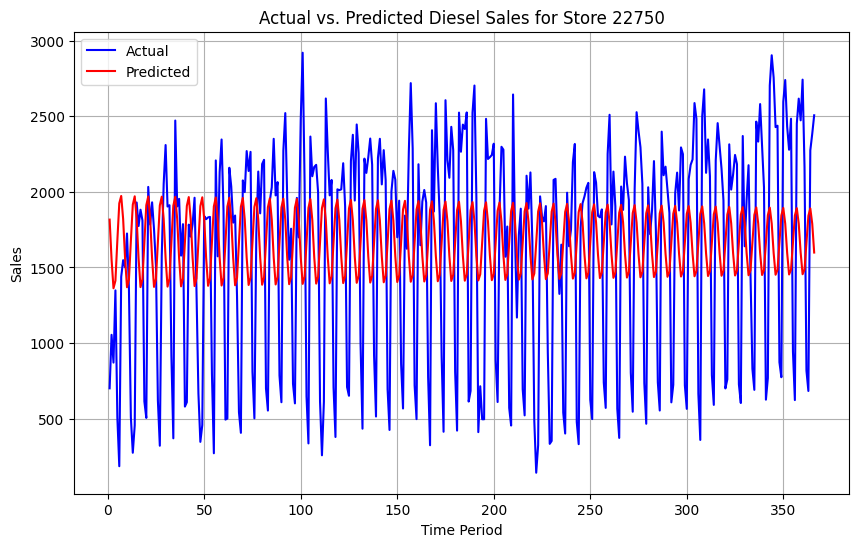

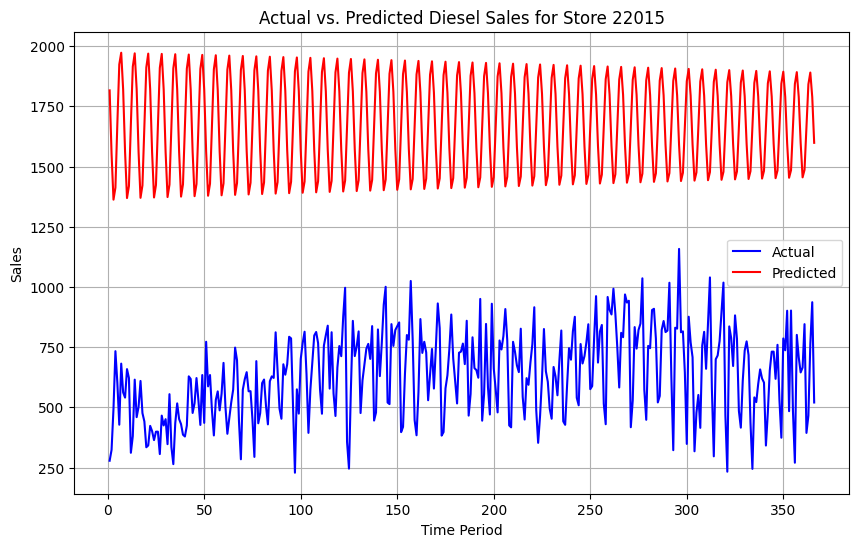

In [ ]:
# Plot the actual vs predicted values of Diesel Sales for each stores in test set
if test_store_forecasts is not None:
    for store_id, forecast in zip(set(test_data['site_id_msba'].unique()) - set(models.keys()), test_store_forecasts):
        store_data = test_data[test_data['site_id_msba'] == store_id]
        actual_data = store_data['diesel_y']
        time_index = range(1, len(actual_data) + 1)
        plt.figure(figsize=(10, 6))
        plt.plot(time_index, actual_data, label='Actual', linestyle='-', color='blue')
        plt.plot(time_index, forecast, label='Predicted', linestyle='-', color='red')
        plt.title(f'Actual vs. Predicted Diesel Sales for Store {store_id}')
        plt.xlabel('Time Period')
        plt.ylabel('Sales')
        plt.legend()
        plt.grid(True)
        plt.show()

In [ ]:
# Evaluate the prediction error metrics for Diesel Sales
results = {}
if test_store_forecasts is not None:
    for store_id, forecast in zip(set(test_data['site_id_msba'].unique()) - set(models.keys()), test_store_forecasts):
        store_data = test_data[test_data['site_id_msba'] == store_id]
        actual_data = store_data['diesel_y']
        # Calculate the Mean Squared Error (MSE) for the predictions
        mse = mean_squared_error(actual_data, forecast)

        # Calculate the Root Mean Squared Error (RMSE)
        rmse = math.sqrt(mse)

        # Store the results in the dictionary
        results['diesel_y'] = {
            'Predictions': forecast,
            'MSE': mse,
            'RMSE': rmse
        }

        print(f"RMSE of Diesel sales for Store {store_id}: {rmse}")
        print('\n')

RMSE of Diesel sales for Store 23905: 1431.2654009941502


RMSE of Diesel sales for Store 22540: 828.655022770292


RMSE of Diesel sales for Store 22260: 1211.856250033932


RMSE of Diesel sales for Store 24535: 663.7452984206017


RMSE of Diesel sales for Store 22750: 817.8264525975349


RMSE of Diesel sales for Store 22015: 1082.959317762205




#### Unleaded


In [ ]:
# Train ARIMA models for each store in traindf
models = train_arima_models(train_data,'unleaded')

In [ ]:
# Make an average forecast for store IDs in the test dataset that are not in the training dataset
test_store_forecasts = average_forecast_for_test_stores(models, test_data,'unleaded')

# if test_store_forecasts is not None:
#     for store_id, forecast in zip(set(test_data['site_id_msba'].unique()) - set(models.keys()), test_store_forecasts):
#         print(f'Average Forecast for Store {store_id}:\n{forecast}')
# else:
#     print('No matching models found in the training data for the new test data store IDs.')

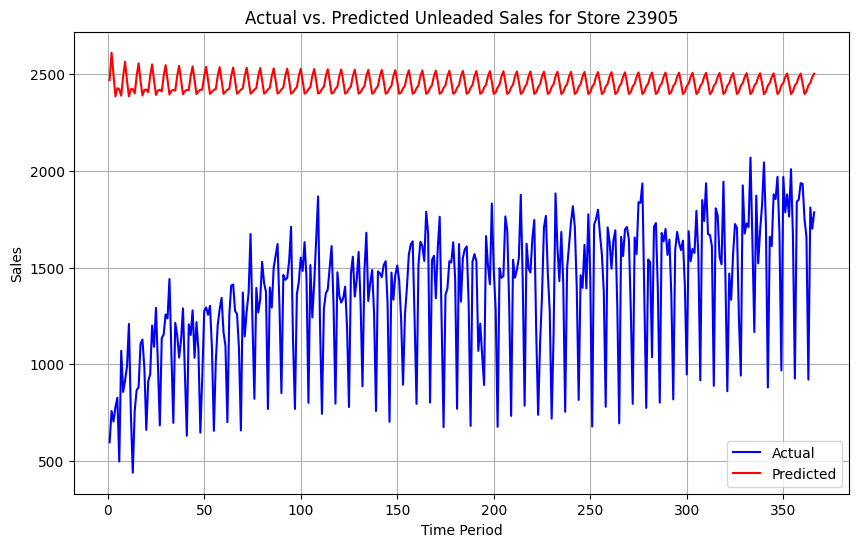

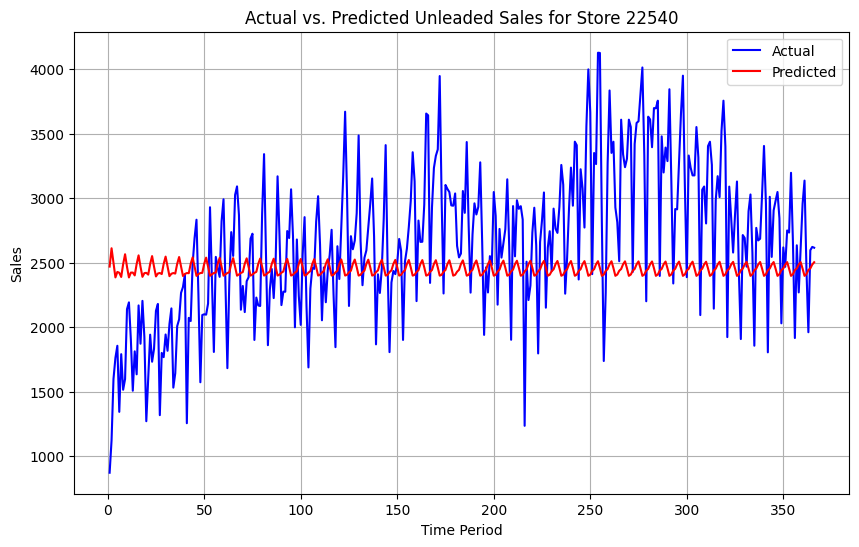

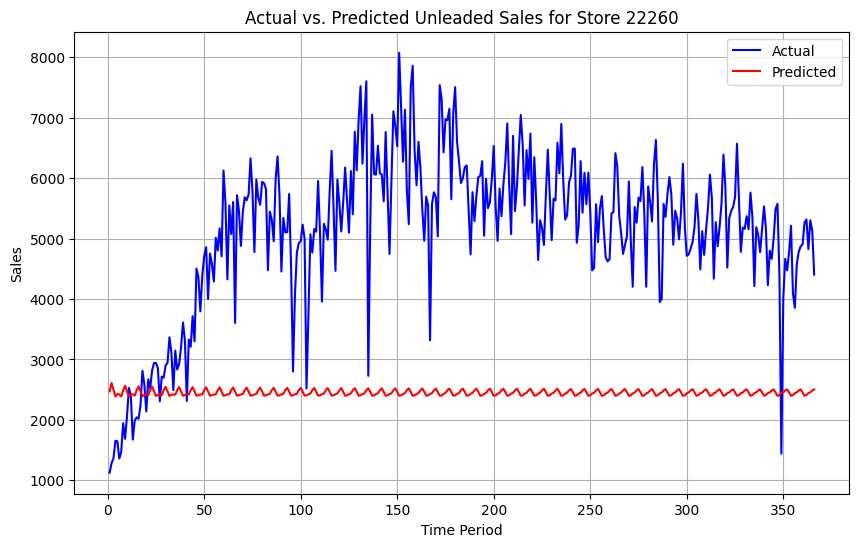

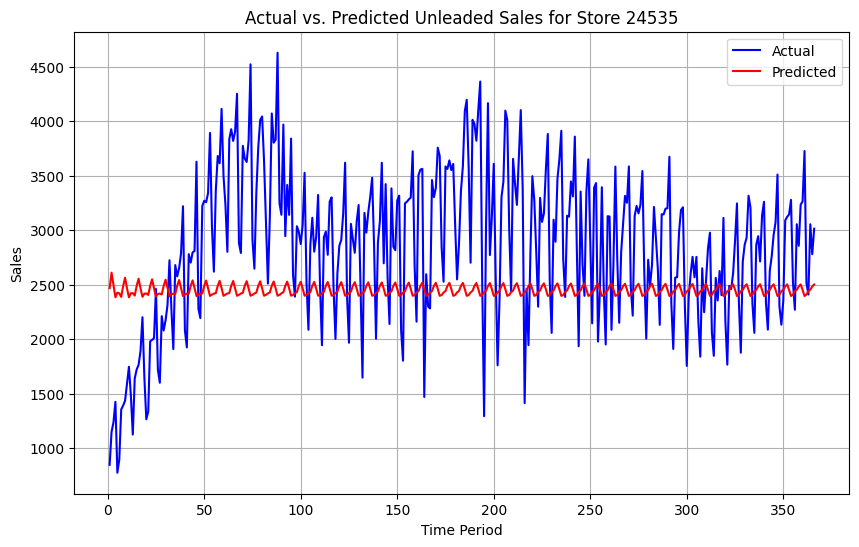

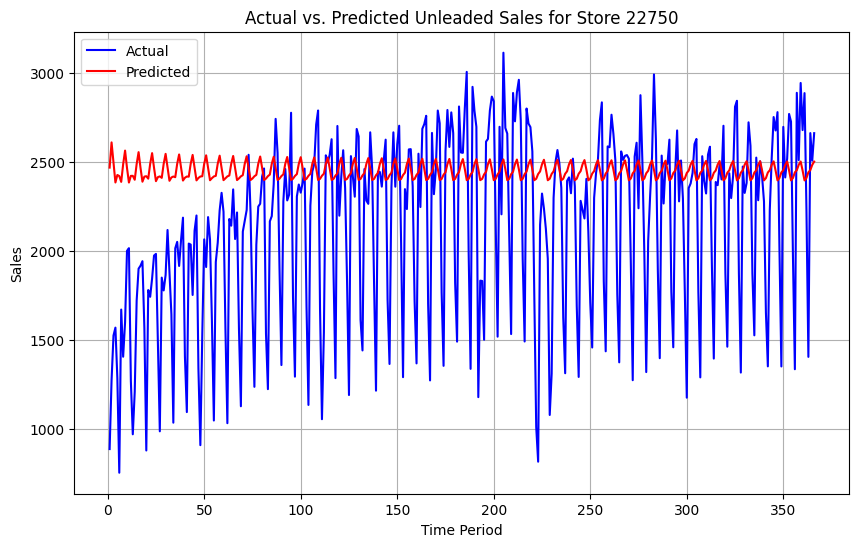

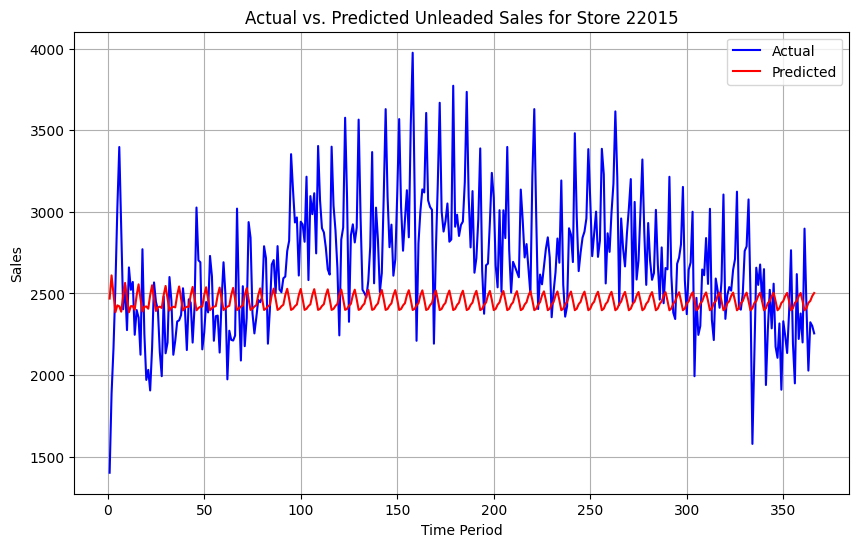

In [ ]:
# Plot the actual vs predicted values of Unleaded Sales for each stores in test set
if test_store_forecasts is not None:
    for store_id, forecast in zip(set(test_data['site_id_msba'].unique()) - set(models.keys()), test_store_forecasts):
        store_data = test_data[test_data['site_id_msba'] == store_id]
        actual_data = store_data['unleaded']
        time_index = range(1, len(actual_data) + 1)
        plt.figure(figsize=(10, 6))
        plt.plot(time_index, actual_data, label='Actual', linestyle='-', color='blue')
        plt.plot(time_index, forecast, label='Predicted', linestyle='-', color='red')
        plt.title(f'Actual vs. Predicted Unleaded Sales for Store {store_id}')
        plt.xlabel('Time Period')
        plt.ylabel('Sales')
        plt.legend()
        plt.grid(True)
        plt.show()

In [ ]:
# Evaluate the prediction error metrics for Unleaded Sales
results = {}
if test_store_forecasts is not None:
    for store_id, forecast in zip(set(test_data['site_id_msba'].unique()) - set(models.keys()), test_store_forecasts):
        store_data = test_data[test_data['site_id_msba'] == store_id]
        actual_data = store_data['unleaded']
        # Calculate the Mean Squared Error (MSE) for the predictions
        mse = mean_squared_error(actual_data, forecast)

        # Calculate the Root Mean Squared Error (RMSE)
        rmse = math.sqrt(mse)

        # Store the results in the dictionary
        results['unleaded'] = {
            'Predictions': forecast,
            'MSE': mse,
            'RMSE': rmse
        }

        print(f"RMSE of Unleaded sales for Store {store_id}: {rmse}")
        print('\n')

RMSE of Unleaded sales for Store 23905: 1136.4475402781302


RMSE of Unleaded sales for Store 22540: 624.829217650214


RMSE of Unleaded sales for Store 22260: 2965.790817897397


RMSE of Unleaded sales for Store 24535: 809.8366288071112


RMSE of Unleaded sales for Store 22750: 603.8662512392697


RMSE of Unleaded sales for Store 22015: 461.05621462836774




### Prophet

Prophet is a forecasting tool developed by Meta  designed to make predictions for time series data with strong seasonal patterns and missing data points.

This model captures weekly and holiday seasonality for each sales metric and uses feature selection to capture strongly correlated variables to improve model performance.

Each sales metric section shows RMSE and MAE for test stores.

Training and Testing the model doesn't take much time, less than five minutes.

Running the cross-validation for the Prophet models takes forty minutes.

In [ ]:
# Training the model

from prophet import Prophet

# Models dictionary
models = {}

# Define the list of extra regressors you want to add.
extra_regressors = [
    # 'x1_mile_pop', 'x1_mile_emp', 'x1_mile_income', 'x1_2_mile_pop', 'x1_2_mile_emp', 'x1_2_mile_income', 'x5_min_pop', 'x7_min_inc',
    'hi_flow_lanes_fueling_positions', 'mens_urinal_count', 'mens_toilet_count', 'womens_sink_count','x5_min_emp', 'x7_min_pop', 'x7_min_emp', 'open_year'
    ,'pizza_No', 'pizza_Yes', 'rv_lanes_No', 'rv_lanes_Yes', 'def_No', 'def_Yes', 'rv_lanes_layout_In-Line', 'rv_lanes_layout_None', 'rv_lanes_layout_Stack',
    'hi_flow_lanes_No', 'hi_flow_lanes_Yes', 'hi_flow_rv_lanes_No', 'hi_flow_rv_lanes_Yes'
    ]

# Train models for each metric
for metric in ['unleaded', 'diesel', 'food_sales', 'inside_sales']:
    # Initialize the Prophet model with holidays
    model = Prophet(holidays=holidays_df)
    # Add each extra regressor to the model
    for regressor in extra_regressors:
        model.add_regressor(regressor)
    # Select the training data for the current metric
    train_data = globals()[f'train_{metric}']
    # Fit the model using both the 'ds', 'y', and the extra regressors
    model.fit(train_data[['ds', 'y'] + extra_regressors])
    # Store the model in the dictionary
    models[metric] = model

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpa2o0uuwc/ragn1qzn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpa2o0uuwc/bbx8qd49.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=32878', 'data', 'file=/tmp/tmpa2o0uuwc/ragn1qzn.json', 'init=/tmp/tmpa2o0uuwc/bbx8qd49.json', 'output', 'file=/tmp/tmpa2o0uuwc/prophet_modeldaql5hcj/prophet_model-20231106022339.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
02:23:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
02:23:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpa2

In [ ]:
# Forecasting for Test Stores
# Dictionary to store forecasts
forecasts = {}

# Forecast for each metric and each store
for store_id in test_stores:
    for metric in ['unleaded', 'diesel', 'food_sales', 'inside_sales']:
        model = models[metric]
        # Select test data for the current store and metric
        test_data = globals()[f'test_{metric}']
        store_test_data = test_data[test_data['store_id'] == store_id]
        # Make sure that your future dataframe includes the regressor values
        # This assumes that the test data includes the same extra regressor columns as the training data
        future_regressors = store_test_data[extra_regressors].reset_index(drop=True)
        # Make future dataframe for the model
        future = model.make_future_dataframe(periods=len(store_test_data))
        future = future.merge(store_test_data[['ds']], on='ds', how='right')
        # Add the regressors to the future dataframe
        future = pd.concat([future, future_regressors], axis=1)
        # Forecast
        forecast = model.predict(future)
        # Store forecast with store ID and metric
        forecasts[(store_id, metric)] = forecast[['ds', 'yhat']]


In [ ]:
# Creating Evaluation Metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error
from math import sqrt

# Evaluation metrics dictionary
evaluation_metrics = {}

# Calculate RMSE and MAE for each store and each metric
for store_id in test_stores:
    for metric in ['unleaded', 'diesel', 'food_sales', 'inside_sales']:
        # Actual sales
        actual = globals()[f'test_{metric}'][globals()[f'test_{metric}']['store_id'] == store_id]['y']
        # Predicted sales
        predicted = forecasts[(store_id, metric)]['yhat']
        # Ensure the lengths of actual and predicted are the same
        min_length = min(len(actual), len(predicted))
        actual, predicted = actual.iloc[:min_length], predicted.iloc[:min_length]
        # Calculate RMSE and MAE
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        # Store in dictionary
        evaluation_metrics[(store_id, metric)] = {'RMSE': rmse, 'MAE': mae}

# Custom sort order
metric_order = {'inside_sales': 1, 'food_sales': 2, 'diesel': 3, 'unleaded': 4}

# Sorting function that uses the metric_order for sorting
def custom_metric_sort(store_metric):
    _, metric = store_metric
    return metric_order[metric]

# Sort the evaluation_metrics keys based on the custom metric order
sorted_metrics = sorted(evaluation_metrics.keys(), key=custom_metric_sort)

# Function to print the metrics for a given type
def print_metrics_for_type(metric_type):
    for store_metric in sorted_metrics:
        store_id, metric = store_metric
        if metric == metric_type:
            metrics = evaluation_metrics[store_metric]
            print(f'Store ID: {store_id} - Metric: {metric}\n\tRMSE: {metrics["RMSE"]:.2f}\n\tMAE: {metrics["MAE"]:.2f}\n')

def plot_actual_vs_predicted(actual, predicted, metric, store_id):
    plt.figure(figsize=(10, 5))
    plt.plot(actual.reset_index(drop=True), label='Actual')
    plt.plot(predicted.reset_index(drop=True), label='Predicted', alpha=0.7)
    plt.title(f'Actual vs Predicted - {metric.capitalize()} for Store {store_id}')
    plt.xlabel('Time')
    plt.ylabel(metric.capitalize())
    plt.legend()
    plt.show()


#### Inside Sales

In [ ]:
# WITH REGRESSORS
# Organized review of metrics by type
print("Inside Sales Metrics:")
print_metrics_for_type('inside_sales')

Inside Sales Metrics:
Store ID: 22540 - Metric: inside_sales
	RMSE: 753.18
	MAE: 589.28

Store ID: 24535 - Metric: inside_sales
	RMSE: 692.72
	MAE: 545.87

Store ID: 22750 - Metric: inside_sales
	RMSE: 1437.94
	MAE: 1245.85

Store ID: 22015 - Metric: inside_sales
	RMSE: 804.98
	MAE: 643.09

Store ID: 22260 - Metric: inside_sales
	RMSE: 712.19
	MAE: 571.96

Store ID: 23905 - Metric: inside_sales
	RMSE: 605.59
	MAE: 474.08



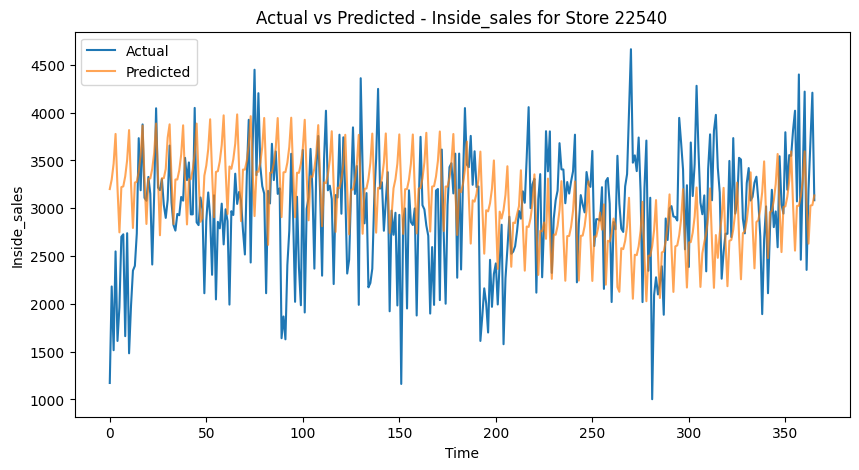

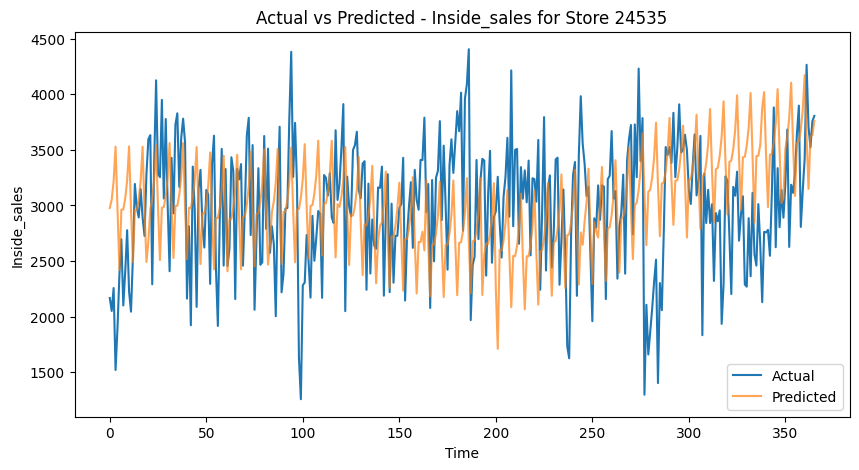

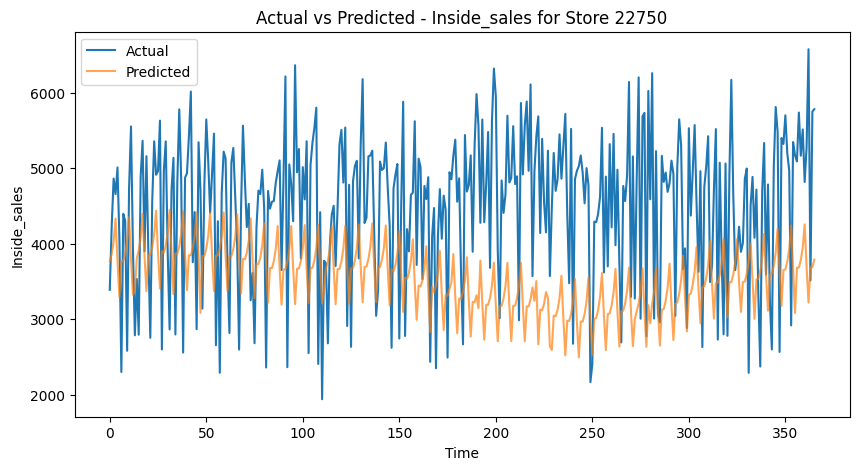

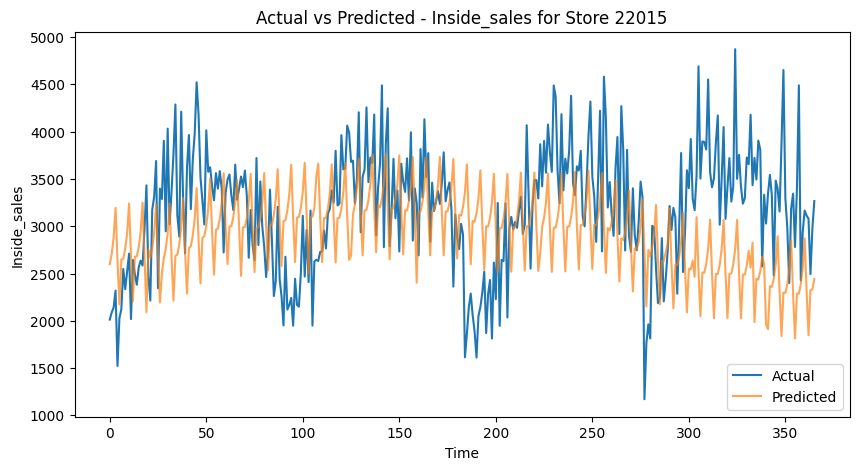

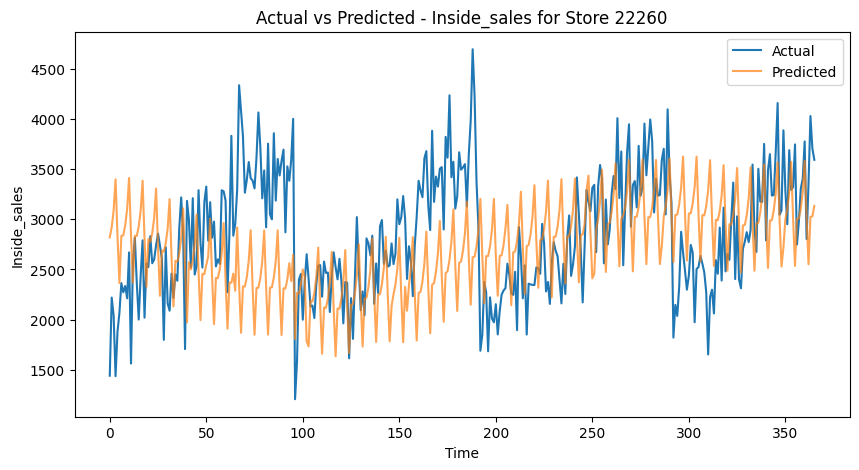

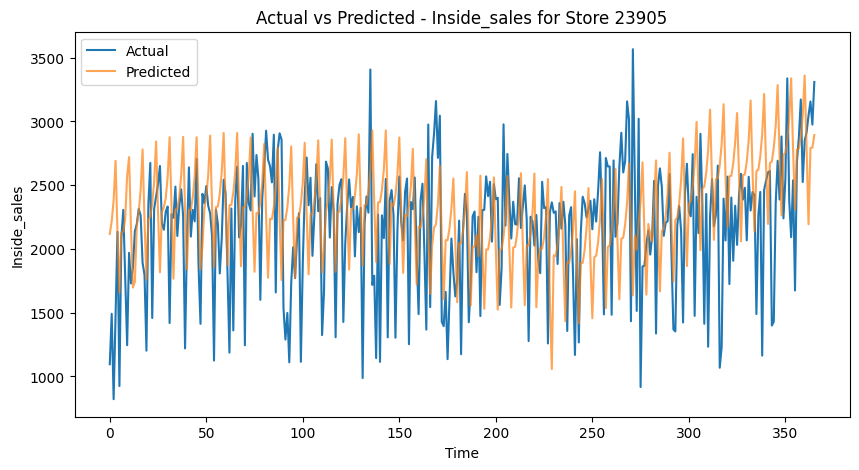

In [ ]:
# Plot actual vs. predicted for 'inside_sales' for each store
for store_id in test_stores:
    metric = 'inside_sales'
    actual = globals()[f'test_{metric}'][globals()[f'test_{metric}']['store_id'] == store_id]['y']
    predicted = forecasts[(store_id, metric)]['yhat']
    min_length = min(len(actual), len(predicted))
    actual, predicted = actual.iloc[:min_length], predicted.iloc[:min_length]
    plot_actual_vs_predicted(actual, predicted, metric, store_id)


#### Food Service

In [ ]:
# WITH REGRESSORS
print("Food Sales Metrics:")
print_metrics_for_type('food_sales')

Food Sales Metrics:
Store ID: 22540 - Metric: food_sales
	RMSE: 282.30
	MAE: 223.87

Store ID: 24535 - Metric: food_sales
	RMSE: 253.63
	MAE: 203.77

Store ID: 22750 - Metric: food_sales
	RMSE: 423.74
	MAE: 374.53

Store ID: 22015 - Metric: food_sales
	RMSE: 281.20
	MAE: 234.11

Store ID: 22260 - Metric: food_sales
	RMSE: 236.53
	MAE: 197.56

Store ID: 23905 - Metric: food_sales
	RMSE: 248.25
	MAE: 203.81



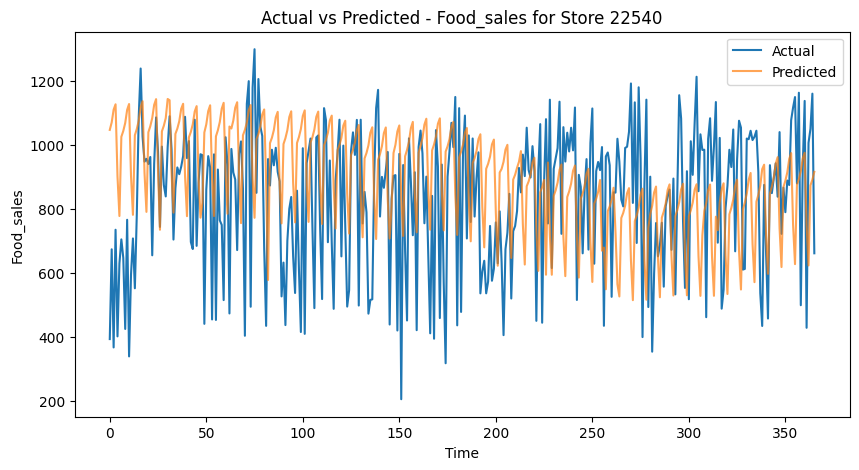

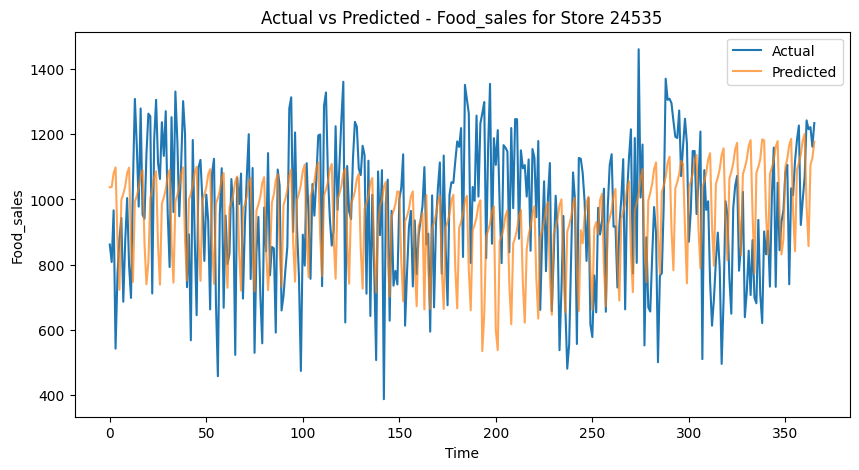

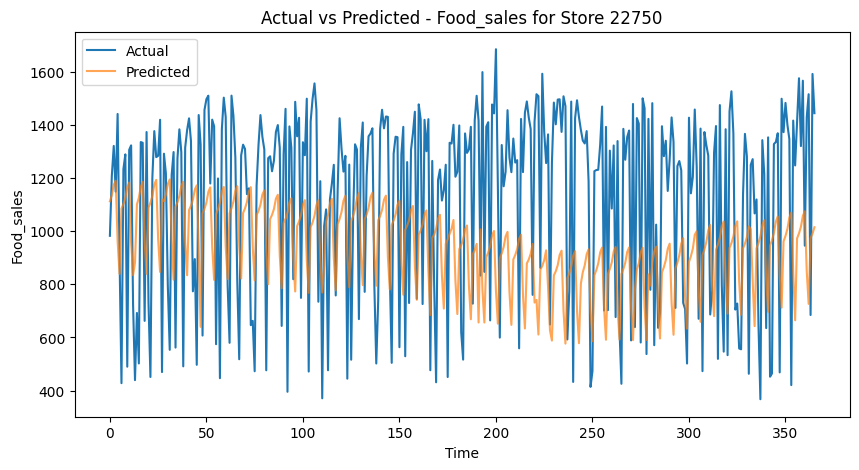

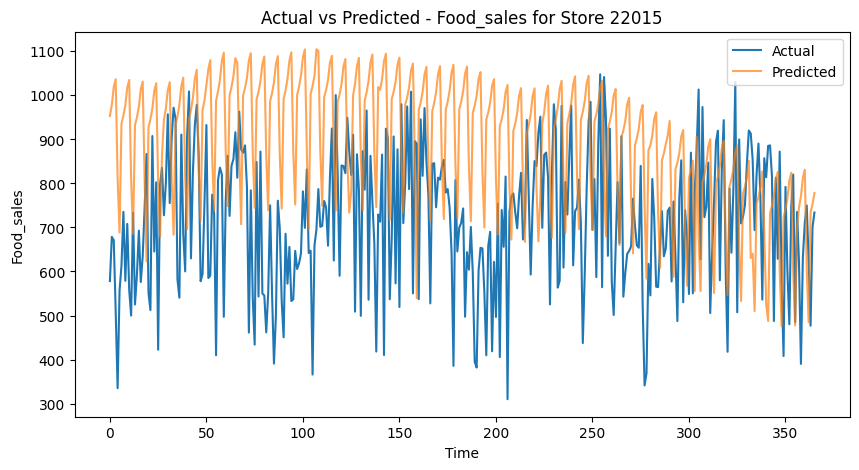

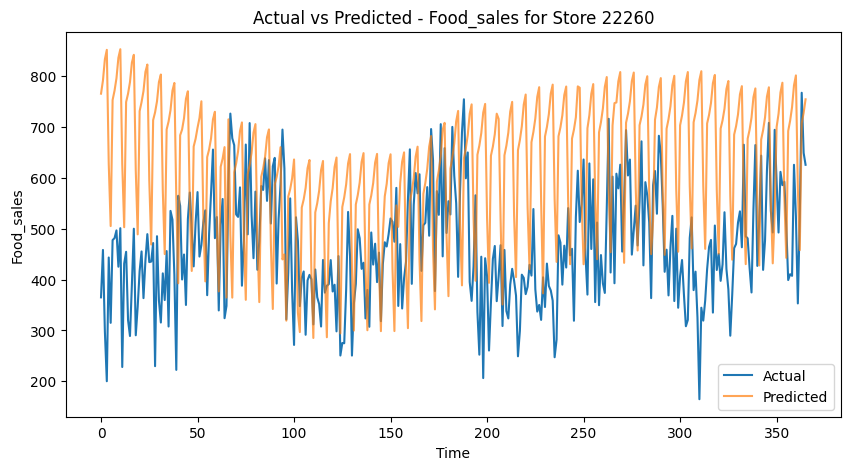

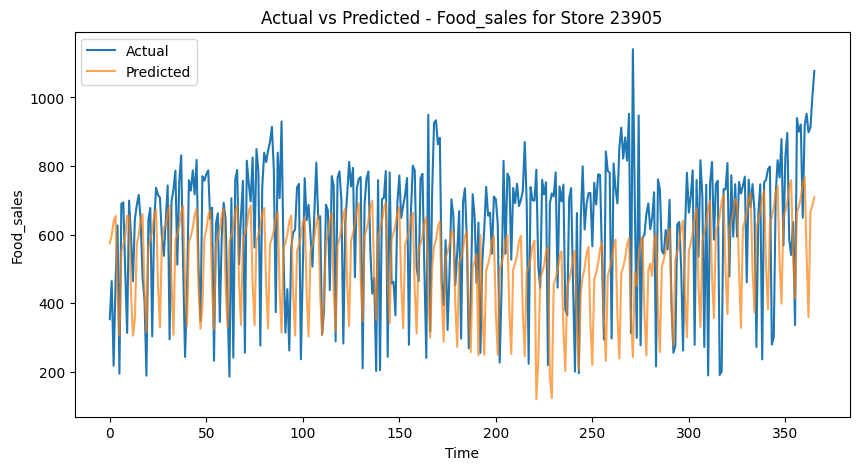

In [ ]:
# Plot actual vs. predicted for 'food_sales' for each store
for store_id in test_stores:
    metric = 'food_sales'
    actual = globals()[f'test_{metric}'][globals()[f'test_{metric}']['store_id'] == store_id]['y']
    predicted = forecasts[(store_id, metric)]['yhat']
    min_length = min(len(actual), len(predicted))
    actual, predicted = actual.iloc[:min_length], predicted.iloc[:min_length]
    plot_actual_vs_predicted(actual, predicted, metric, store_id)


#### Diesel

In [ ]:
#INCLUDE REGRESSORS
print("Diesel Sales Metrics:")
print_metrics_for_type('diesel')

Diesel Sales Metrics:
Store ID: 22540 - Metric: diesel
	RMSE: 822.55
	MAE: 663.47

Store ID: 24535 - Metric: diesel
	RMSE: 696.67
	MAE: 555.33

Store ID: 22750 - Metric: diesel
	RMSE: 928.55
	MAE: 791.40

Store ID: 22015 - Metric: diesel
	RMSE: 781.43
	MAE: 624.65

Store ID: 22260 - Metric: diesel
	RMSE: 425.63
	MAE: 344.67

Store ID: 23905 - Metric: diesel
	RMSE: 725.81
	MAE: 628.25



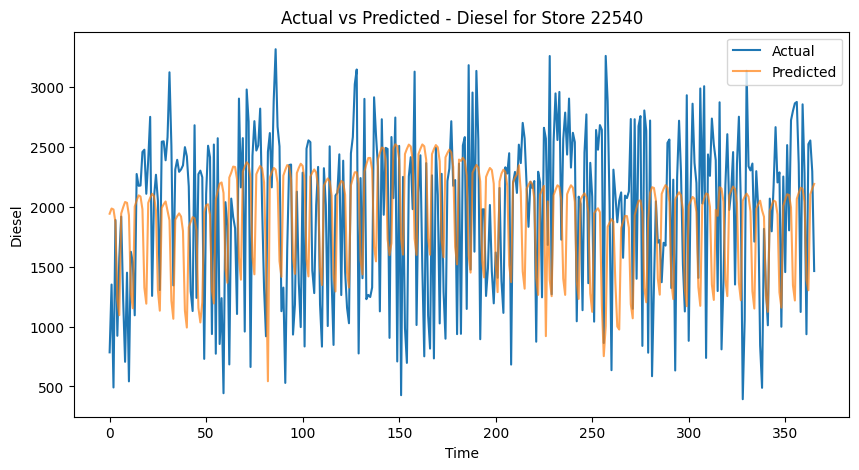

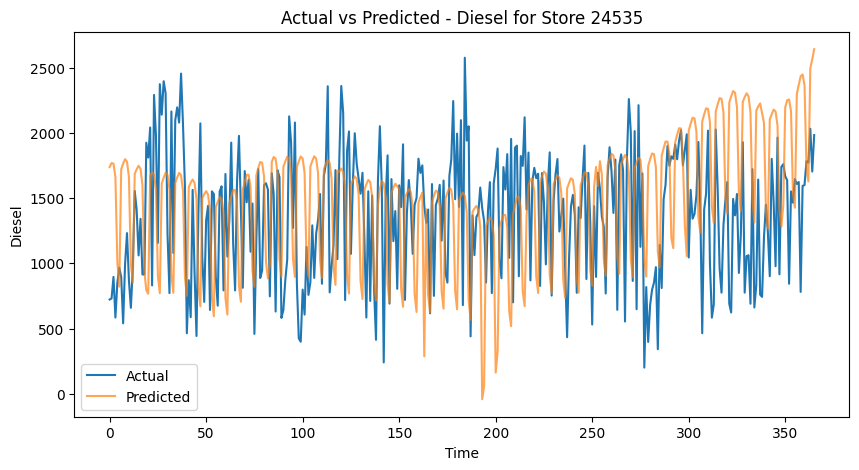

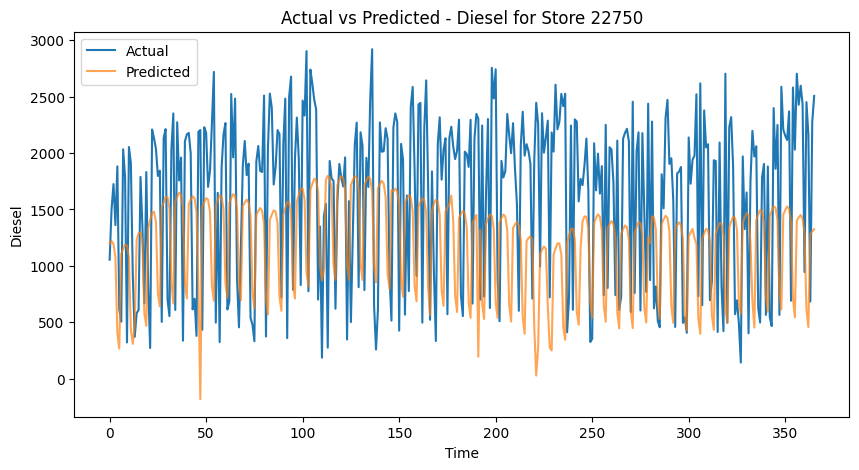

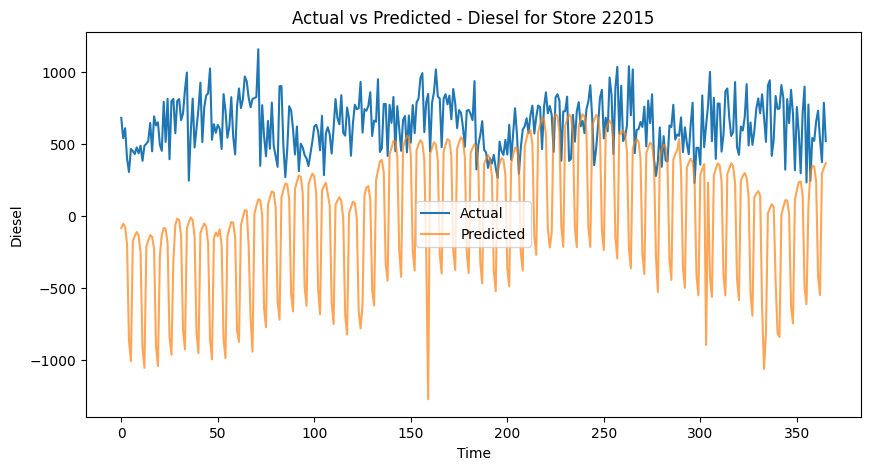

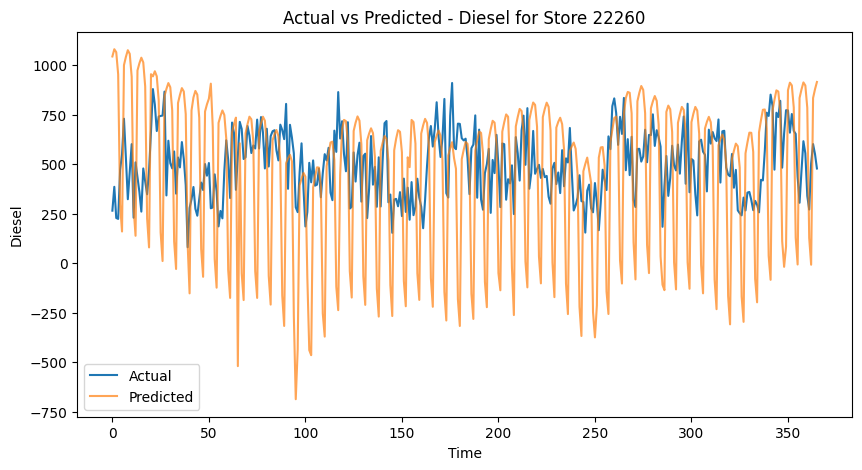

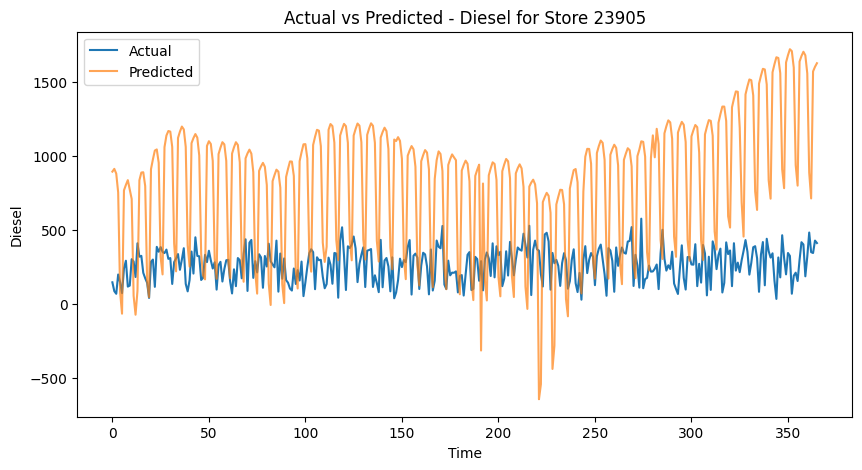

In [ ]:
# Plot actual vs. predicted for 'diesel' for each store
for store_id in test_stores:
    metric = 'diesel'
    actual = globals()[f'test_{metric}'][globals()[f'test_{metric}']['store_id'] == store_id]['y']
    predicted = forecasts[(store_id, metric)]['yhat']
    min_length = min(len(actual), len(predicted))
    actual, predicted = actual.iloc[:min_length], predicted.iloc[:min_length]
    plot_actual_vs_predicted(actual, predicted, metric, store_id)


#### Unleaded

In [ ]:
# WITH REGRESSORS
print("Unleaded Sales Metrics:")
print_metrics_for_type('unleaded')

Unleaded Sales Metrics:
Store ID: 22540 - Metric: unleaded
	RMSE: 1073.46
	MAE: 929.15

Store ID: 24535 - Metric: unleaded
	RMSE: 929.69
	MAE: 762.01

Store ID: 22750 - Metric: unleaded
	RMSE: 1065.65
	MAE: 934.37

Store ID: 22015 - Metric: unleaded
	RMSE: 2253.82
	MAE: 2205.77

Store ID: 22260 - Metric: unleaded
	RMSE: 4459.89
	MAE: 4260.25

Store ID: 23905 - Metric: unleaded
	RMSE: 574.88
	MAE: 460.57



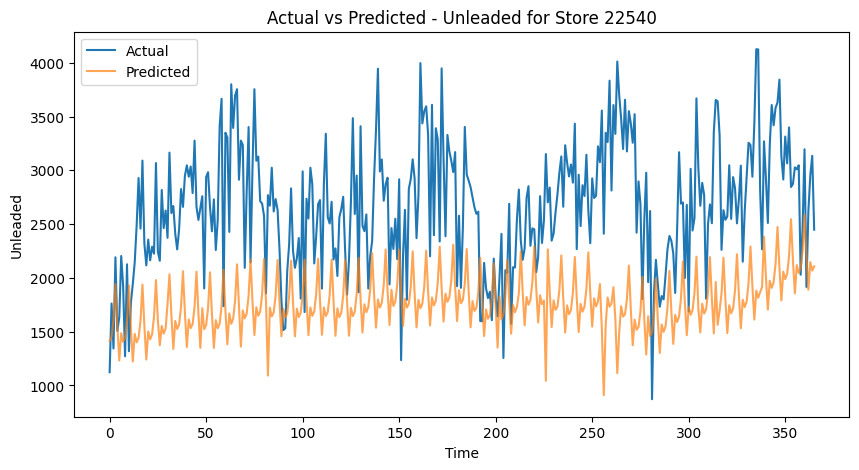

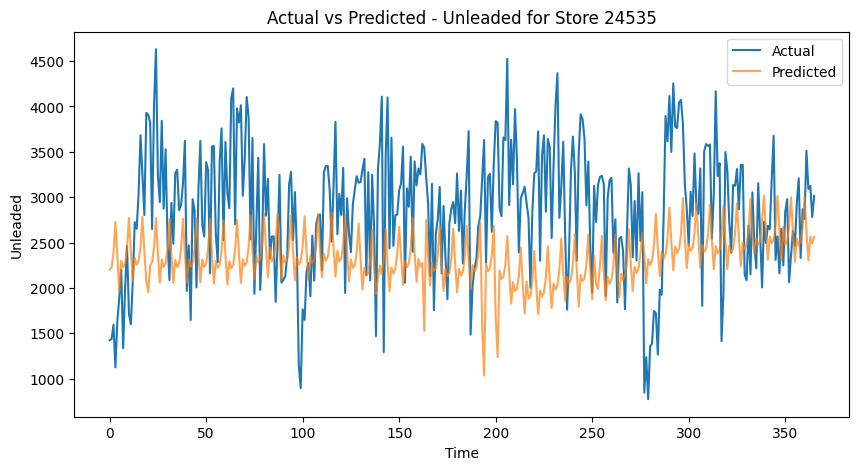

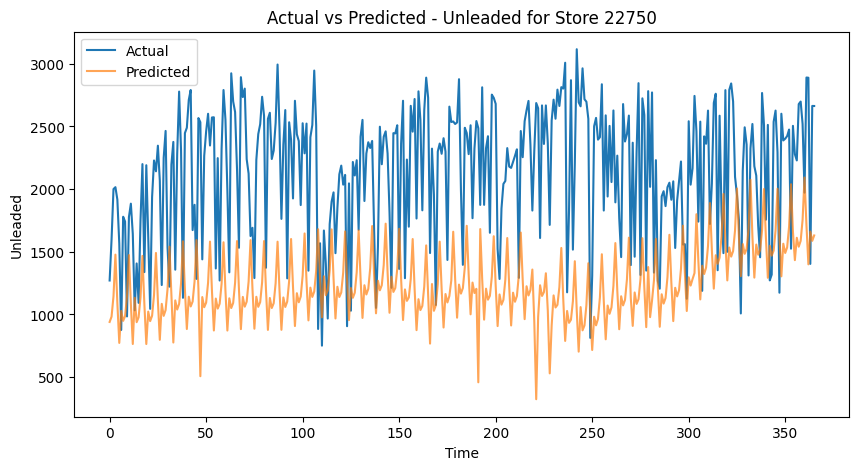

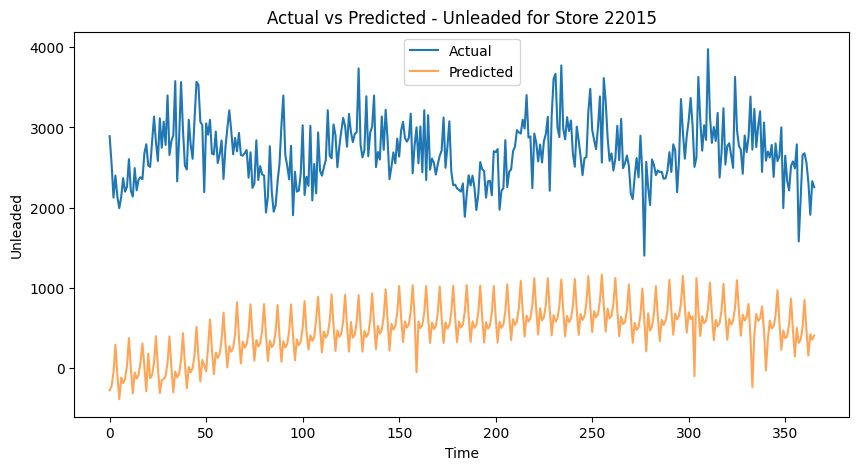

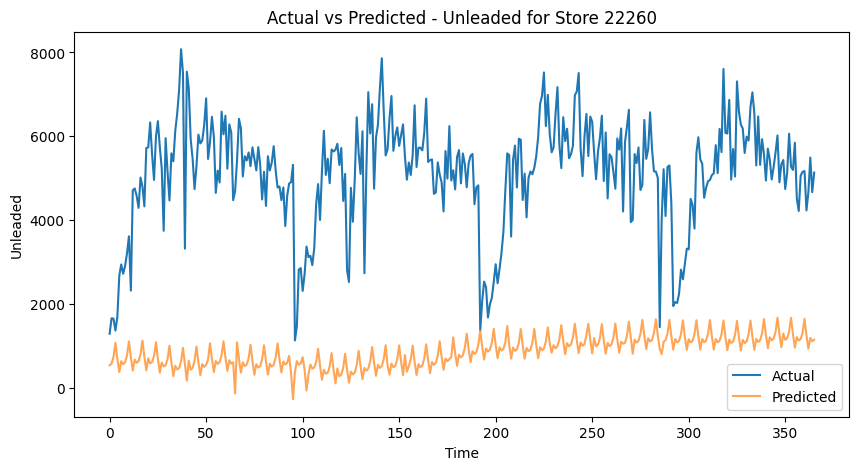

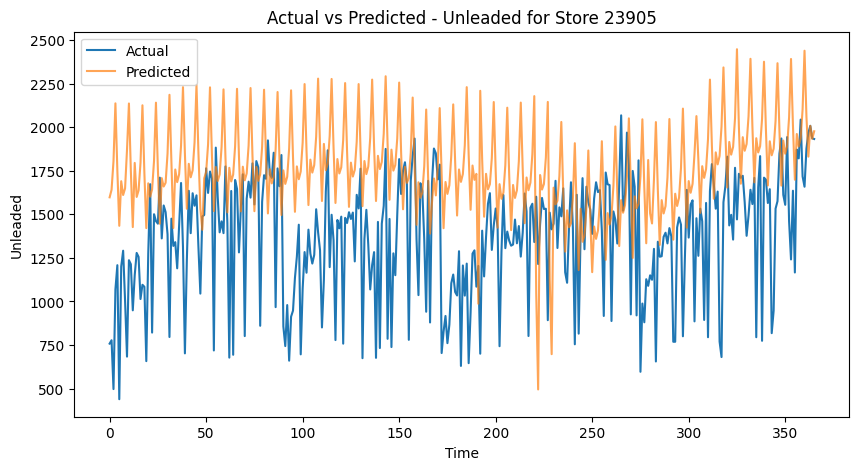

In [ ]:
# Plot actual vs. predicted for 'unleaded' for each store
for store_id in test_stores:
    metric = 'unleaded'
    actual = globals()[f'test_{metric}'][globals()[f'test_{metric}']['store_id'] == store_id]['y']
    predicted = forecasts[(store_id, metric)]['yhat']
    min_length = min(len(actual), len(predicted))
    actual, predicted = actual.iloc[:min_length], predicted.iloc[:min_length]
    plot_actual_vs_predicted(actual, predicted, metric, store_id)

#### Cross-Validation

Cross-Validation for Prophet shows how the model would forecast daily sales for each metric over 365 days. Performance metrics are outlined below.

In [ ]:
from prophet.diagnostics import cross_validation, performance_metrics
from prophet import Prophet

# Define the cross-validation function for Prophet
def cross_validate_prophet(data, initial, period, horizon, extra_regressors):
    # Initialize the Prophet model with holidays
    model = Prophet(holidays=holidays_df)
    # Add each extra regressor to the model
    for regressor in extra_regressors:
        model.add_regressor(regressor)
    # Fit the model using both the 'ds', 'y', and the extra regressors
    model.fit(data[['ds', 'y'] + extra_regressors])

    # Perform cross-validation
    df_cv = cross_validation(model, initial=initial, period=period, horizon=horizon)

    # Calculate performance metrics
    df_p = performance_metrics(df_cv)
    return df_p

# Define the initial training period, the period between cutoffs, and the forecast horizon
initial = '515 days'  # the first two years of data for training
period = '1 days'   # spacing between cutoff dates
horizon = '365 days'  # forecast horizon

# Create an empty dictionary to store performance metrics for each metric
cv_metrics = {}

# List of metrics
metrics = ['unleaded', 'diesel', 'food_sales', 'inside_sales']

# Loop through each metric to perform cross-validation
for metric in metrics:
    # Get the appropriate DataFrame
    data = globals()[f'prophet_df_{metric}']

    # Perform cross-validation and get performance metrics
    performance = cross_validate_prophet(data, initial, period, horizon, extra_regressors)

    # Store the performance metrics in the dictionary
    cv_metrics[metric] = performance

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvt4dq2q_/zyhiv2h2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvt4dq2q_/id0klah2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90431', 'data', 'file=/tmp/tmpvt4dq2q_/zyhiv2h2.json', 'init=/tmp/tmpvt4dq2q_/id0klah2.json', 'output', 'file=/tmp/tmpvt4dq2q_/prophet_model24k428yo/prophet_model-20231105183133.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:31:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:31:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 67 forecasts with cutoffs between 2022-06-11 00:00:00 and 2022-08-16 00:00:00


  0%|          | 0/67 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpvt4dq2q_/nwint2gc.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvt4dq2q_/sv6c5aos.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82576', 'data', 'file=/tmp/tmpvt4dq2q_/nwint2gc.json', 'init=/tmp/tmpvt4dq2q_/sv6c5aos.json', 'output', 'file=/tmp/tmpvt4dq2q_/prophet_model4q9fnsfy/prophet_model-20231105183138.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:31:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:31:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvt4dq2q_/xicjic6y.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvt4dq2q_/2j130txx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/67 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpvt4dq2q_/fjvta8ra.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvt4dq2q_/rvumqqhb.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30762', 'data', 'file=/tmp/tmpvt4dq2q_/fjvta8ra.json', 'init=/tmp/tmpvt4dq2q_/rvumqqhb.json', 'output', 'file=/tmp/tmpvt4dq2q_/prophet_modelbqsour8g/prophet_model-20231105183647.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:36:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:36:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvt4dq2q_/4117ebpa.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvt4dq2q_/e5olb2ud.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/67 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpvt4dq2q_/ocr02a8_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvt4dq2q_/d12vil_1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=57452', 'data', 'file=/tmp/tmpvt4dq2q_/ocr02a8_.json', 'init=/tmp/tmpvt4dq2q_/d12vil_1.json', 'output', 'file=/tmp/tmpvt4dq2q_/prophet_model81gsrw7o/prophet_model-20231105184141.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:41:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:41:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvt4dq2q_/x84gc9ld.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvt4dq2q_/ejwl5nu1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

  0%|          | 0/67 [00:00<?, ?it/s]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpvt4dq2q_/qejmgv55.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvt4dq2q_/do1eskru.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63039', 'data', 'file=/tmp/tmpvt4dq2q_/qejmgv55.json', 'init=/tmp/tmpvt4dq2q_/do1eskru.json', 'output', 'file=/tmp/tmpvt4dq2q_/prophet_modelar1dph3s/prophet_model-20231105184653.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:46:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:46:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvt4dq2q_/j35iylhj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvt4dq2q_/fd98dq02.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/

##### Inside Sales

In [ ]:
# Print the performance metrics for inside_sales
print("Performance metrics for inside_sales:")
inside_sales_performance = cv_metrics['inside_sales']
print(inside_sales_performance)
print("\n")

Performance metrics for inside_sales:
     horizon           mse         rmse         mae      mape     mdape  \
0    24 days  1.170841e+06  1082.054169  879.036220  0.339471  0.255493   
1    25 days  1.173199e+06  1083.143072  880.152867  0.339721  0.255797   
2    26 days  1.175624e+06  1084.261911  881.273797  0.340039  0.256784   
3    27 days  1.177609e+06  1085.176940  882.128795  0.340257  0.257216   
4    28 days  1.177847e+06  1085.286787  882.320856  0.340290  0.257387   
..       ...           ...          ...         ...       ...       ...   
337 361 days  8.138253e+05   902.122664  714.031686  0.216777  0.194777   
338 362 days  8.139143e+05   902.171994  714.582782  0.216962  0.194898   
339 363 days  8.134987e+05   901.941604  714.773911  0.217033  0.194979   
340 364 days  8.128974e+05   901.608223  714.755221  0.217045  0.194889   
341 365 days  8.115742e+05   900.874144  714.415975  0.216954  0.194863   

        smape  coverage  
0    0.295533  0.608235  
1    0.29

##### Food Service

In [ ]:
# Print the performance metrics for food_sales
print("Performance metrics for food_sales:")
food_sales_performance = cv_metrics['food_sales']
print(food_sales_performance)
print("\n")

Performance metrics for food_sales:
     horizon            mse        rmse         mae      mape     mdape  \
0    24 days  131951.913084  363.251859  298.642415  0.464042  0.342864   
1    25 days  131752.552031  362.977344  298.429489  0.463278  0.342073   
2    26 days  131593.825840  362.758633  298.180899  0.462511  0.342369   
3    27 days  131397.337941  362.487707  297.968551  0.462045  0.341880   
4    28 days  130817.845651  361.687497  297.240086  0.460807  0.340696   
..       ...            ...         ...         ...       ...       ...   
337 361 days   77115.889199  277.697478  219.743863  0.267897  0.207983   
338 362 days   76974.696762  277.443141  219.694861  0.267723  0.207856   
339 363 days   76681.986759  276.915126  219.372757  0.267223  0.207550   
340 364 days   76476.801871  276.544394  219.148101  0.266906  0.207257   
341 365 days   76278.019930  276.184757  218.966085  0.266587  0.207098   

        smape  coverage  
0    0.384794  0.535102  
1    0.3840

##### Diesel

In [ ]:
# Print the performance metrics for diesel
print("Performance metrics for diesel:")
diesel_performance = cv_metrics['diesel']
print(diesel_performance)
print("\n")

Performance metrics for diesel:
     horizon           mse         rmse          mae      mape     mdape  \
0    24 days  2.658435e+06  1630.470744  1321.903992  3.051086  0.885799   
1    25 days  2.662697e+06  1631.777384  1323.078246  3.050018  0.883392   
2    26 days  2.664037e+06  1632.187777  1323.473068  3.044111  0.884077   
3    27 days  2.666668e+06  1632.993497  1324.171616  3.042063  0.883935   
4    28 days  2.666873e+06  1633.056429  1323.812561  3.040404  0.883270   
..       ...           ...          ...          ...       ...       ...   
337 361 days  5.086935e+06  2255.423418  1722.580087  1.858556  0.919907   
338 362 days  5.103666e+06  2259.129462  1725.615145  1.850429  0.920312   
339 363 days  5.117267e+06  2262.137644  1728.204943  1.842303  0.919223   
340 364 days  5.133675e+06  2265.761398  1731.398038  1.835890  0.919025   
341 365 days  5.151586e+06  2269.710541  1734.855046  1.829876  0.919001   

        smape  coverage  
0    1.021199  0.413066  
1  

##### Unleaded

In [ ]:
# Print the performance metrics for unleaded
print("Performance metrics for unleaded:")
unleaded_performance = cv_metrics['unleaded']
print(unleaded_performance)
print("\n")

Performance metrics for unleaded:
     horizon           mse         rmse          mae      mape     mdape  \
0    24 days  2.099370e+06  1448.920368  1172.311639  0.610487  0.393515   
1    25 days  2.099122e+06  1448.834868  1172.292461  0.609864  0.393691   
2    26 days  2.100194e+06  1449.204498  1171.679775  0.609527  0.392846   
3    27 days  2.098144e+06  1448.497254  1171.084197  0.609226  0.392846   
4    28 days  2.095702e+06  1447.654011  1170.825634  0.608914  0.393280   
..       ...           ...          ...          ...       ...       ...   
337 361 days  1.082422e+06  1040.395312   846.056497  0.486685  0.289239   
338 362 days  1.083910e+06  1041.110141   846.725940  0.487006  0.289334   
339 363 days  1.085217e+06  1041.737295   847.175590  0.487340  0.289111   
340 364 days  1.086949e+06  1042.568400   847.931147  0.487793  0.289122   
341 365 days  1.088257e+06  1043.195728   848.744761  0.488135  0.289208   

        smape  coverage  
0    0.459832  0.519989  
1

### XGBoost

XGBoost, which stands for Extreme Gradient Boosting, is a scalable, distributed gradient-boosted decision tree (GBDT) machine learning library. It provides parallel tree boosting and is the leading machine learning library for regression, classification, and ranking problems.

The model runs quickly and efficiently for this initial round of exploration and fitting. As we build upon and tune the model, we may need to reevaluate these statistics. Like we mentioned earlier in the analysis, we will primarily use RMSE to evaluate model performance.

In [ ]:
import xgboost as xgb
from xgboost import plot_importance, plot_tree
plt.style.use('fivethirtyeight')

In [ ]:
# creating additional, simplified features
def create_features(df, label=None):
    """
    Creates time series features from datetime index
    """
    df['date'] = df.index
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear

    X = df[['dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X

In [ ]:
# function for mean absolute percentage error
def mean_absolute_percentage_error(y_true, y_pred):
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [ ]:
# fetching datasets
train_xgb = train_data.copy()
test_xgb = test_data.copy()

#### Inside Sales
Benchmark </br>
(MAE): 707.2735125491541</br>
(RMSE): 967.2567077320317</br>

In [ ]:
# fetching key variable
test = test_xgb['daily_yoy_ndt.total_inside_sales']
train = train_xgb['daily_yoy_ndt.total_inside_sales']

train=train.to_frame()
test=test.to_frame()

In [ ]:
# adding additional features
X_train, y_train = create_features(train, label='daily_yoy_ndt.total_inside_sales')
X_test, y_test = create_features(test, label='daily_yoy_ndt.total_inside_sales')

In [ ]:
# train + fit model
reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False) # Change verbose to True if you want to see it train

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
# plots were originally designed to split by date and not store, so they were omitted
# performance markings are available in aggregate, rather than by store
MSE = mean_squared_error(y_true=test['daily_yoy_ndt.total_inside_sales'],
                   y_pred=test['Prediction'])
print("Mean Squared Error:\n")
print(MSE)
RMSE = math.sqrt(MSE)
print("Root Mean Square Error:\n")
print(RMSE)
MA = mean_absolute_error(y_true=test['daily_yoy_ndt.total_inside_sales'],
                   y_pred=test['Prediction'])
print("Mean Absolute Error:\n")
print(MA)
MAPE = mean_absolute_percentage_error(y_true=test['daily_yoy_ndt.total_inside_sales'],
                   y_pred=test['Prediction'])
print("Mean Absolute Percentage Error:\n")
print(MAPE)

Mean Squared Error:

948822.2032054599
Root Mean Square Error:

974.0750500887804
Mean Absolute Error:

716.1317585569287
Mean Absolute Percentage Error:

22.932527948494425


#### Food Service

Benchmark</br>
(MAE): 236.37052076466694</br>
(RMSE): 298.75333424739136</br>

In [ ]:
# fetching key variable
test = test_xgb['daily_yoy_ndt.total_food_service']
train = train_xgb['daily_yoy_ndt.total_food_service']

train=train.to_frame()
test=test.to_frame()

In [ ]:
# adding additional features
X_train, y_train = create_features(train, label='daily_yoy_ndt.total_food_service')
X_test, y_test = create_features(test, label='daily_yoy_ndt.total_food_service')

In [ ]:
# train + fit model
reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False) # Change verbose to True if you want to see it train

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
# plots were originally designed to split by date and not store, so they were omitted
# performance markings are available in aggregate, rather than by store
MSE = mean_squared_error(y_true=test['daily_yoy_ndt.total_food_service'],
                   y_pred=test['Prediction'])
print("Mean Squared Error:\n")
print(MSE)
RMSE = math.sqrt(MSE)
print("Root Mean Square Error:\n")
print(RMSE)
MA = mean_absolute_error(y_true=test['daily_yoy_ndt.total_food_service'],
                   y_pred=test['Prediction'])
print("Mean Absolute Error:\n")
print(MA)
MAPE = mean_absolute_percentage_error(y_true=test['daily_yoy_ndt.total_food_service'],
                   y_pred=test['Prediction'])
print("Mean Absolute Percentage Error:\n")
print(MAPE)

Mean Squared Error:

78354.10832880033
Root Mean Square Error:

279.91803859129965
Mean Absolute Error:

218.2183312461311
Mean Absolute Percentage Error:

31.564734544680572


#### Diesel

Benchmark</br>
(MAE): 889.6733050759848</br>
(RMSE): 1003.2789422445452</br>

In [ ]:
# fetching key variable
test = test_xgb['diesel_y']
train = train_xgb['diesel_y']

train=train.to_frame()
test=test.to_frame()

In [ ]:
# adding additional features
X_train, y_train = create_features(train, label='diesel_y')
X_test, y_test = create_features(test, label='diesel_y')

In [ ]:
# train + fit model
reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False) # Change verbose to True if you want to see it train

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
# plots were originally designed to split by date and not store, so they were omitted
# performance markings are available in aggregate, rather than by store
MSE = mean_squared_error(y_true=test['diesel_y'],
                   y_pred=test['Prediction'])
print("Mean Squared Error:\n")
print(MSE)
RMSE = math.sqrt(MSE)
print("Root Mean Square Error:\n")
print(RMSE)
MA = mean_absolute_error(y_true=test['diesel_y'],
                   y_pred=test['Prediction'])
print("Mean Absolute Error:\n")
print(MA)
MAPE = mean_absolute_percentage_error(y_true=test['diesel_y'],
                   y_pred=test['Prediction'])
print("Mean Absolute Percentage Error:\n")
print(MAPE)

Mean Squared Error:

798908.4006685578
Root Mean Square Error:

893.8167601184025
Mean Absolute Error:

784.0354247468764
Mean Absolute Percentage Error:

195.32196664300227


#### Unleaded

Benchmark</br>
(MAE): 906.8842300356473</br>
(RMSE): 1345.069038082699</br>

In [ ]:
# fetching key variable
test = test_xgb['unleaded']
train = train_xgb['unleaded']

train=train.to_frame()
test=test.to_frame()

In [ ]:
# adding additional features
X_train, y_train = create_features(train, label='unleaded')
X_test, y_test = create_features(test, label='unleaded')

In [ ]:
# train + fit model
reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False) # Change verbose to True if you want to see it train

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
# plots were originally designed to split by date and not store, so they were omitted
# performance markings are available in aggregate, rather than by store
MSE = mean_squared_error(y_true=test['unleaded'],
                   y_pred=test['Prediction'])
print("Mean Squared Error:\n")
print(MSE)
RMSE = math.sqrt(MSE)
print("Root Mean Square Error:\n")
print(RMSE)
MA = mean_absolute_error(y_true=test['unleaded'],
                   y_pred=test['Prediction'])
print("Mean Absolute Error:\n")
print(MA)
MAPE = mean_absolute_percentage_error(y_true=test['unleaded'],
                   y_pred=test['Prediction'])
print("Mean Absolute Percentage Error:\n")
print(MAPE)

Mean Squared Error:

1969600.9135623742
Root Mean Square Error:

1403.4247089040346
Mean Absolute Error:

987.5865762812713
Mean Absolute Percentage Error:

36.71317545054376


#Results

The average RMSE for each sales metric for the models are as follows:

**ETS**

Inside Sales: 966.19

Food Service: 301.34

Diesel: 794.32

Unleaded: 1302.74


**ARIMA**

Inside Sales: 903.78

Food Service: 308.01

Diesel: 1006.06

Unleaded: 1100.31


**Prophet**

Inside Sales: 834.43

Food Service: 287.61

Diesel: 730.11

Unleaded: 1726.23


**XGBoost**

Inside Sales: 974.08

Food Service: 279.92

Diesel: 893.82

Unleaded: 1403.42


All models performed very well. However, Prophet produces the lowest RMSE scores for all sales metrics (with the exception of unleaded). As of this assignment submission, we will move forward with Prophet.


Before we present to Maverik, we will continue to make improvements to our models to see if any perform better than Prophet.


1. ETS could incorporate rolling window and feature selection.


2. ARIMA will have hyperparameters tuned, as well as adding seasonal ordering to identify trends.


3. Prophet hyperparameters will be tuned.


4. XGBoost could have more robust feature selection and creation. Could look into testing several test stores individually instead of aggregate.


#Contributions


**Bhoomika John Pedely**
- Collaborated with team to make decisions regarding the modeling process
- Worked with the team to preprocess the data
- Trained and tested the ETS model
- Contributed to the writing and organization of the document

**Roman Brock**
- Worked with the team to algin modeling process / datasets
- Trained and tested XGBoost model
- Helped the team assemble the final document
- Tested splitting the data by date in addition to by store

**Pablo Zarate**
- Worked with team to align modeling processes
- Trained and tested Prophet
- Contributed to the writing and organization of the final document

**Biva Sherchan**
- Worked with the team to do our individual modeling and came prepared in team meetings to discuss the success and failures during the modeling process
- Trained and tested ARIMA model
- Contributed to put together the notebook